In [1]:
from sentence_transformers import SentenceTransformer

In [2]:
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import HTML

0         False
1         False
2         False
3         False
4         False
          ...  
155339    False
155340    False
155341    False
155342    False
155343    False
Length: 155344, dtype: bool
590
0         False
1         False
2         False
3         False
4         False
          ...  
155339    False
155340    False
155341    False
155342    False
155343    False
Length: 154754, dtype: bool
15044
<class 'pandas.core.frame.DataFrame'>
Index: 139710 entries, 0 to 155343
Data columns (total 10 columns):
 #   Column                          Non-Null Count   Dtype 
---  ------                          --------------   ----- 
 0   Investors                       139710 non-null  object
 1   Primary Contact                 139709 non-null  object
 2   Description                     139710 non-null  object
 3   Geography                       139710 non-null  object
 4   Preferred Industry              139696 non-null  object
 5   Preferred Investment Type       139168 non-n

C:\Users\leung\AppData\Local\Temp\ipykernel_13332\607891812.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  investment_type_count = investment_type_count.dropna()[~investment_type_count['Investment Categories'].isin(['Not specific','Not relevant'])]
C:\Users\leung\AppData\Local\Temp\ipykernel_13332\4087647590.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  geography_count = geography_count.dropna()[~geography_count['Geography Categories_by countries'].isin(['Not specific','Not Relevant'])]
C:\Users\leung\AppData\Local\Temp\ipykernel_13332\29434665.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  investment_type_count = investment_type_count.dropna()[~investment_type_count['Investment Categories'].isin(['Not specific','Not relevant'])]


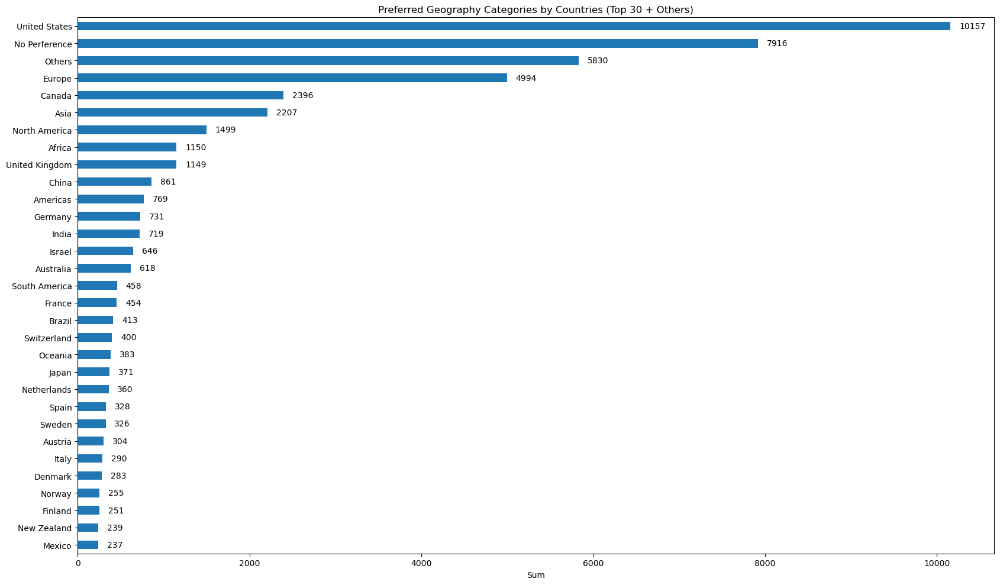

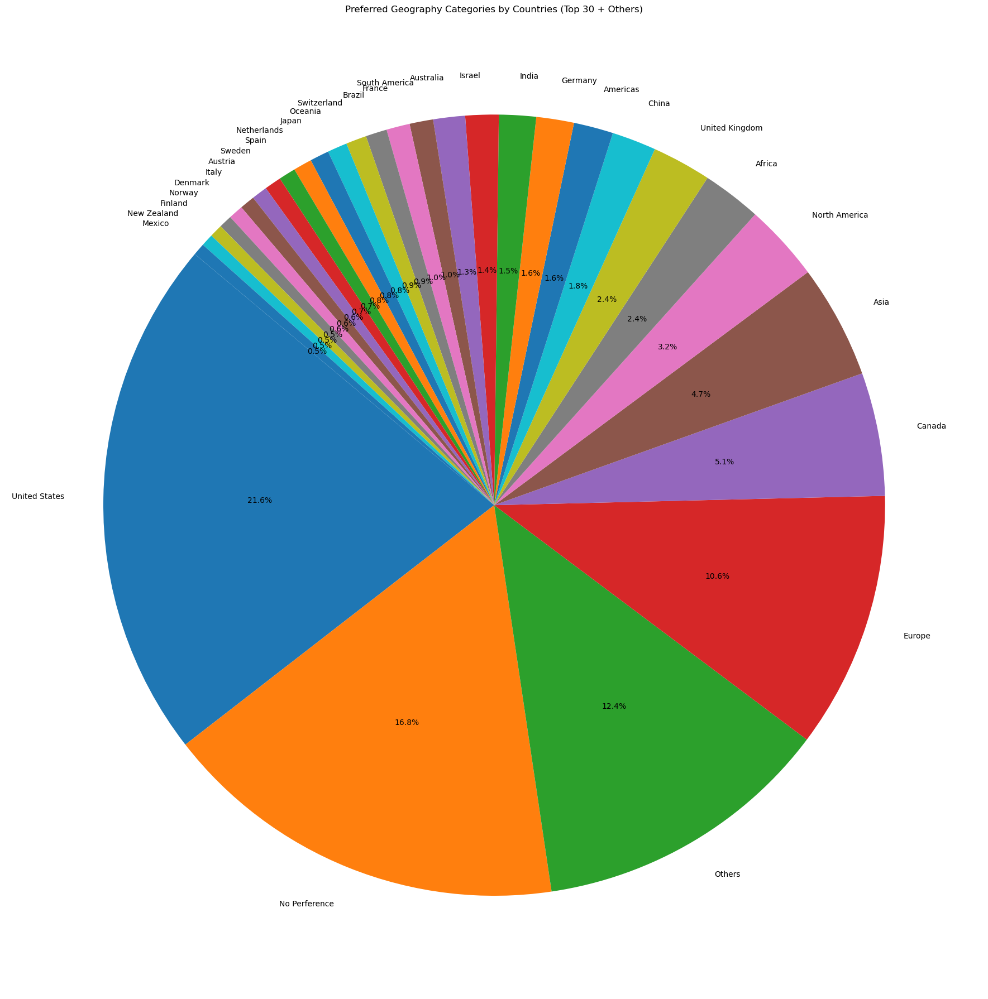

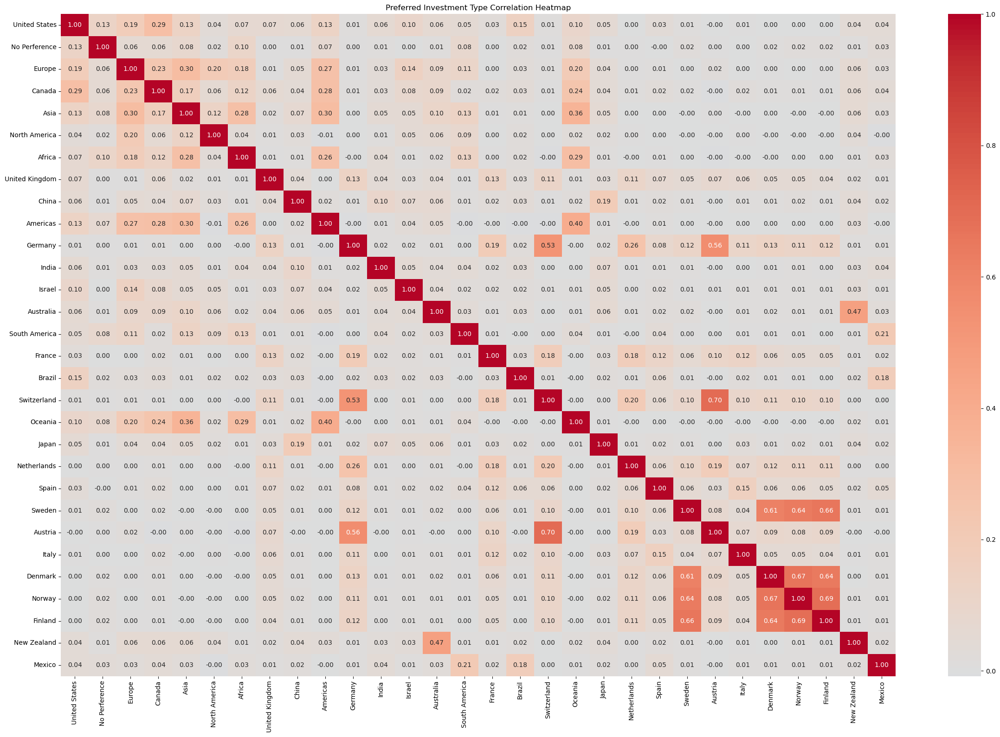

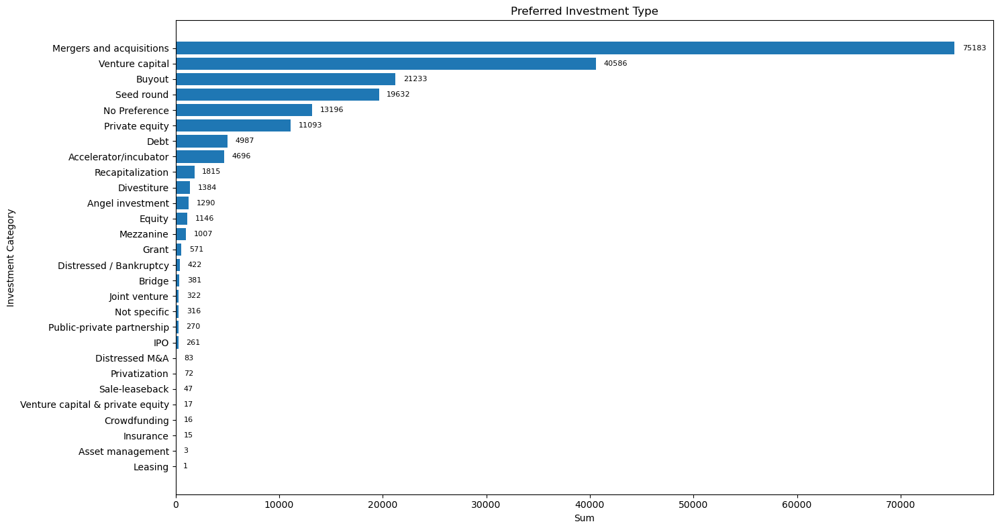

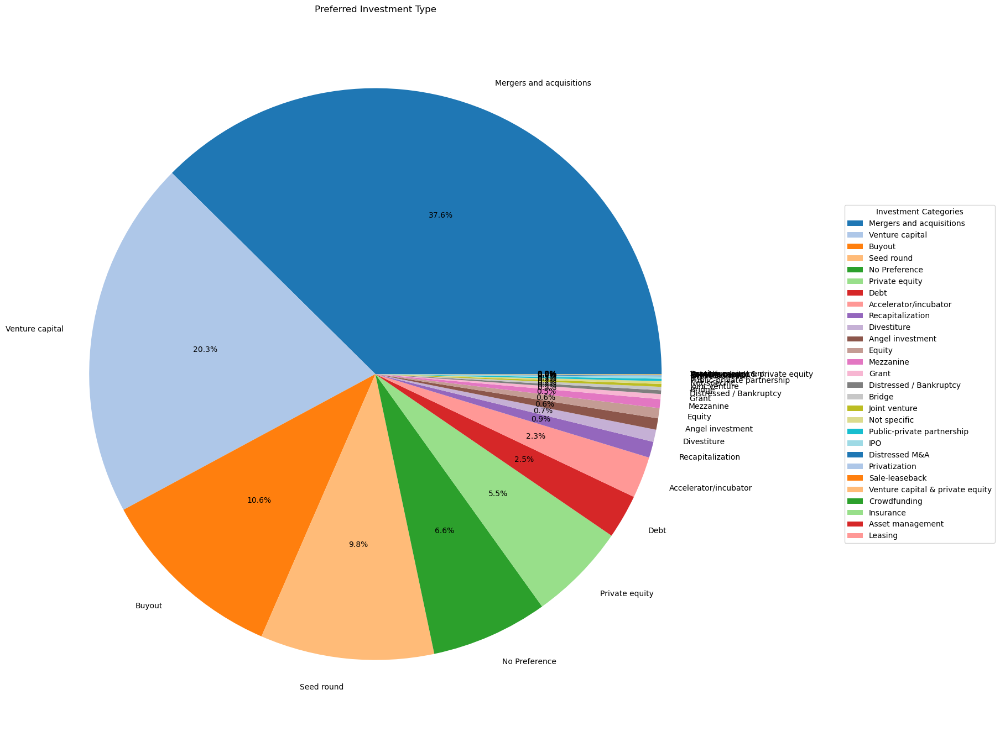

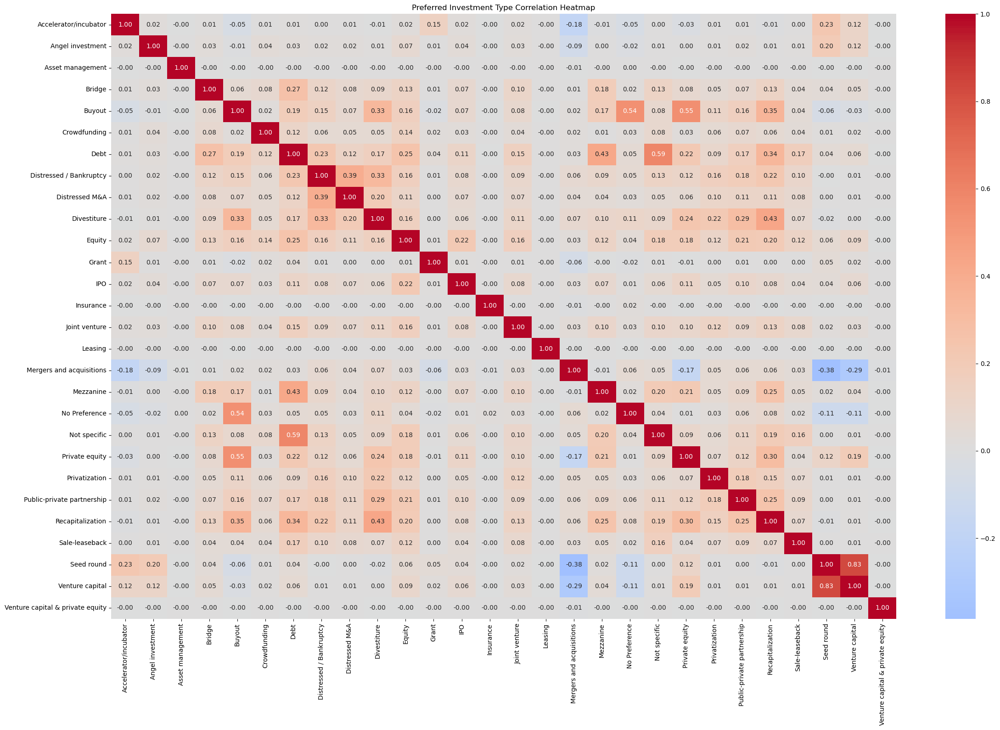

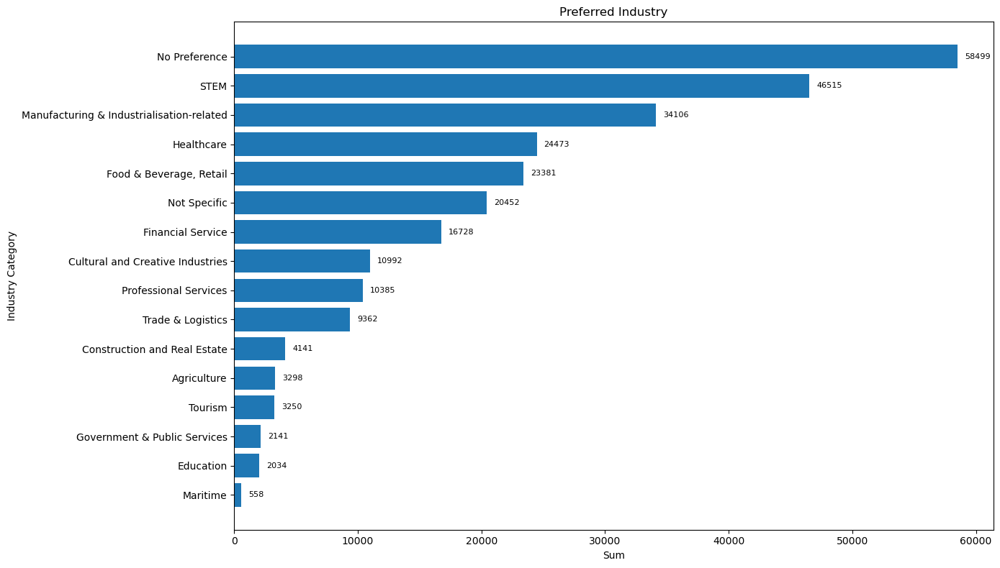

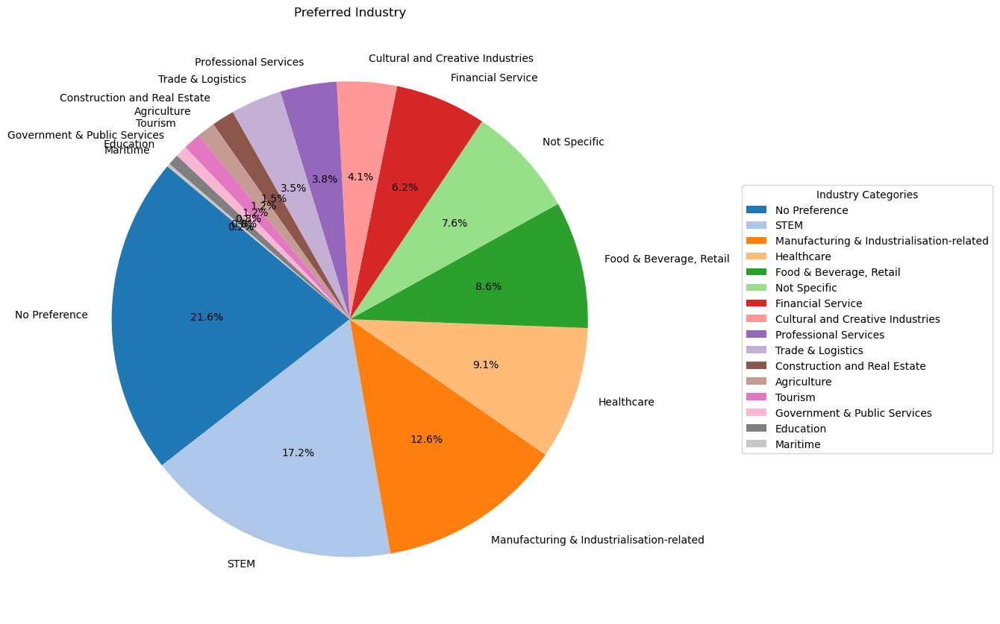

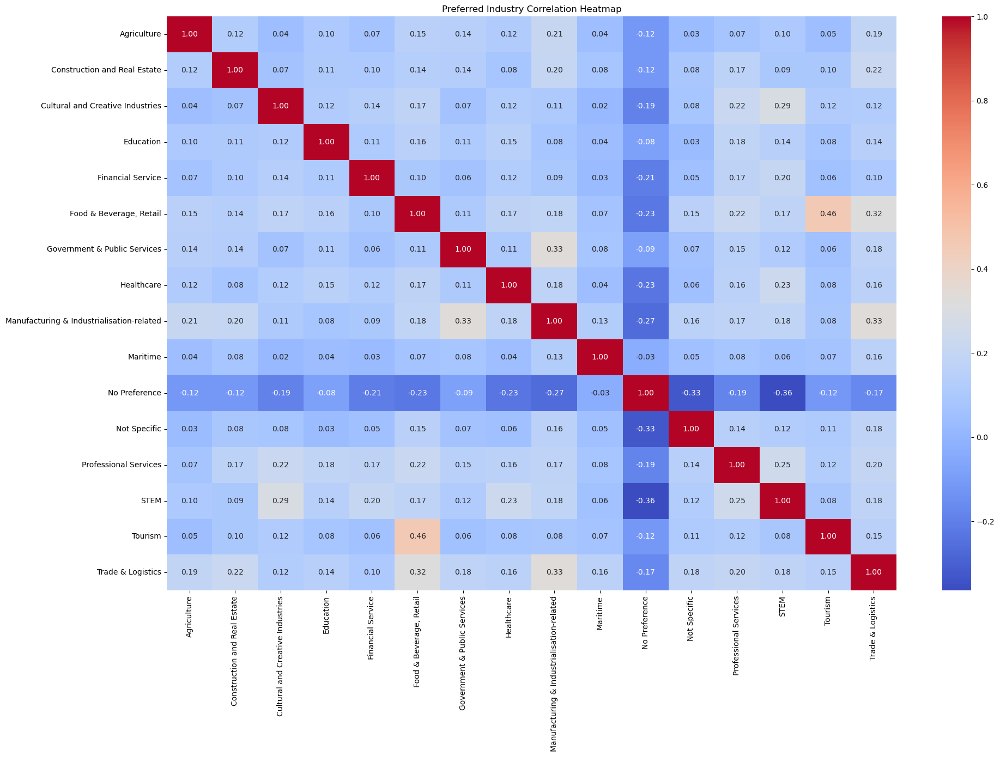

In [3]:
%run "EDA by Python.ipynb"

## SentenceTransformer Encoding

In [4]:
model = SentenceTransformer('all-MiniLM-L6-v2')

### Geography

In [5]:

geography_embeddings = model.encode(geography_count.geography_tags.tolist())

In [6]:
import umap.umap_ as umap

#Reduce dimensions using umap (good for large dataset)
umap_model = umap.UMAP(n_components=2, random_state=42)
geography_embeddings_umap = umap_model.fit_transform(geography_embeddings)
geography_embeddings_umap

# Combine geography_tags_list.index and geography_embeddings_umap into a DataFrame
geography_embeddings_umap_df = pd.DataFrame({
    'Geography': geography_count.geography_tags,
    'Dimension_1': [embedding[0] for embedding in geography_embeddings_umap],
    'Dimension_2': [embedding[1] for embedding in geography_embeddings_umap]
})
geography_embeddings_umap_df

geography_embeddings_umap_df

c:\Users\leung\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


,Geography,Dimension_1,Dimension_2
1,united states,7.426336,-2.142599
2,europe,9.057121,-3.145132
3,canada,6.835590,-2.037454
4,north america,7.304031,-2.366180
5,asia,11.533536,-1.876656
...,...,...,...
3369,saudi arabia.,10.697309,-0.800912
3397,lesotho,10.021734,1.998306
3552,india.,10.518393,-1.364715
3629,africa and other regions.,10.465020,1.893452


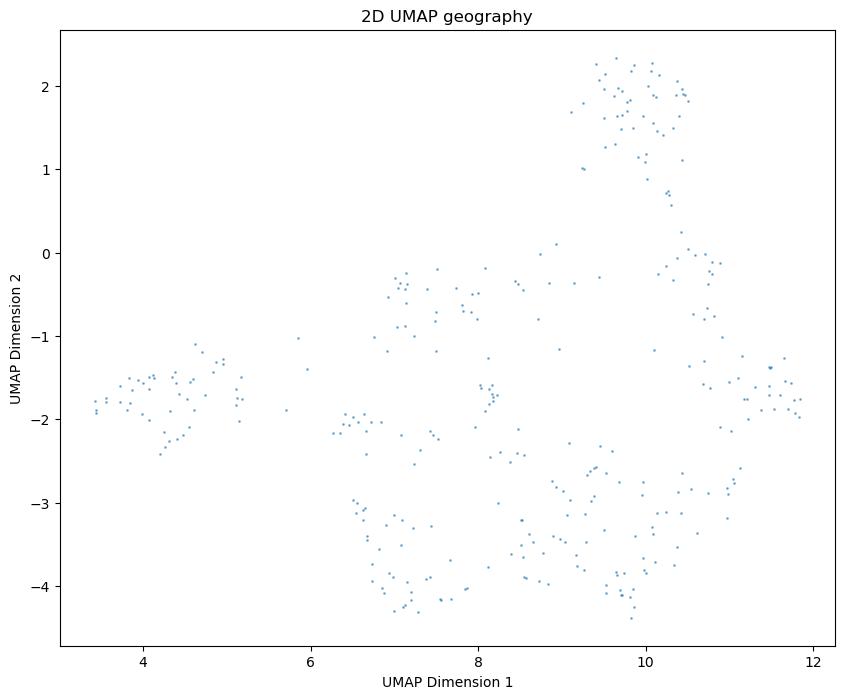

In [7]:
# fix. set the color 86160

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.scatter(geography_embeddings_umap_df['Dimension_1'], geography_embeddings_umap_df['Dimension_2'], s=1, alpha=0.5)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('2D UMAP geography')
plt.show()

### investment type

In [8]:
investment_type_count

,preferred_investment_type_tags,count,Investment Categories
0,merger/acquisition,72743,Mergers and acquisitions
2,early stage vc,22782,Venture capital
3,seed round,19632,Seed round
4,buyout/lbo,18816,Buyout
5,later stage vc,17734,Venture capital
...,...,...,...
292,multi-line insurance,1,Insurance
294,property and casualty insurance,1,Insurance
302,leasing and others.,1,Leasing
315,bank debt,1,Debt


In [9]:
investment_categories_count  = investment_type_count.groupby('Investment Categories')['count'].sum()
investment_categories_count

Investment Categories
Accelerator/incubator                4696
Angel investment                     1290
Asset management                        3
Bridge                                381
Buyout                              21233
Crowdfunding                           16
Debt                                 4987
Distressed / Bankruptcy               422
Distressed M&A                         83
Divestiture                          1384
Equity                               1146
Grant                                 571
IPO                                   261
Insurance                              15
Joint venture                         322
Leasing                                 1
Mergers and acquisitions            75183
Mezzanine                            1007
Private equity                      11093
Privatization                          72
Public-private partnership            270
Recapitalization                     1815
Sale-leaseback                         47
Seed round  

c:\Users\leung\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


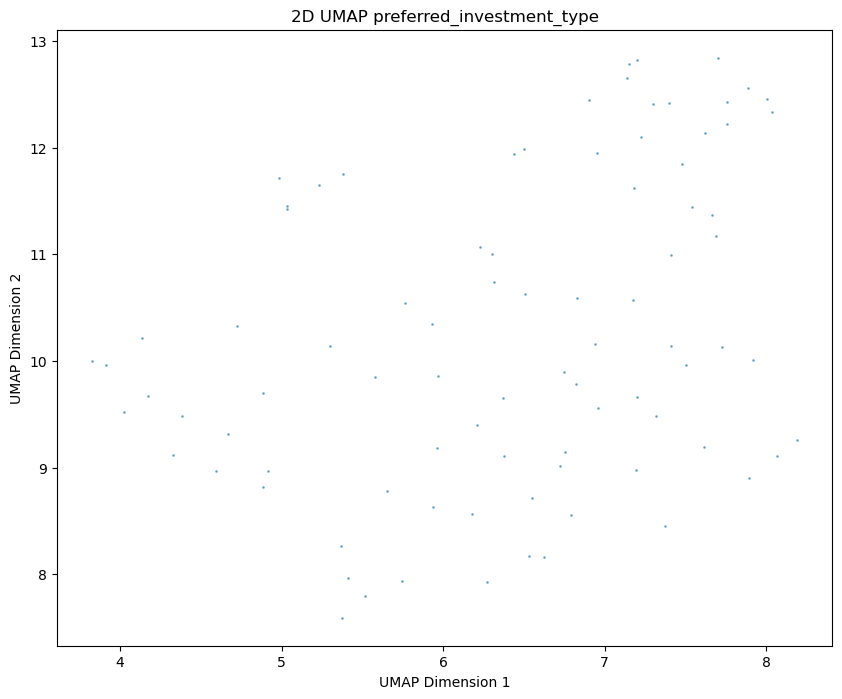

In [10]:
investment_type_embeddings = model.encode(investment_type_count.preferred_investment_type_tags.to_list())

umap_model = umap.UMAP(n_components=2, random_state=42)
investment_type_embeddings_umap = umap_model.fit_transform(investment_type_embeddings)

investment_type_embeddings_umap_df = pd.DataFrame({
    'investment_type': investment_type_count.preferred_investment_type_tags,
    'Dimension_1': [embedding[0] for embedding in investment_type_embeddings_umap],
    'Dimension_2': [embedding[1] for embedding in investment_type_embeddings_umap]
})

plt.figure(figsize=(10, 8))
plt.scatter(investment_type_embeddings_umap_df['Dimension_1'], investment_type_embeddings_umap_df['Dimension_2'], s=1, alpha=0.5)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('2D UMAP preferred_investment_type')
plt.show()

In [53]:
investment_type_embeddings_umap_df

,investment_type,Dimension_1,Dimension_2
0,merger/acquisition,7.410641,10.144247
2,early stage vc,4.172321,9.670577
3,seed round,4.592599,8.969703
4,buyout/lbo,5.654512,8.778360
5,later stage vc,4.024254,9.517828
...,...,...,...
292,multi-line insurance,4.985423,11.715460
294,property and casualty insurance,5.229894,11.648980
302,leasing and others.,5.764440,10.543558
315,bank debt,8.037208,12.339093


### preferred_industry

In [11]:
preferred_industry_categories_count = preferred_industry_count.groupby('industries categories')['count'].sum()
preferred_industry_categories_count

industries categories
Agriculture                                   3298
Construction and Real Estate                  4141
Cultural and Creative Industries             10992
Education                                     2034
Financial Service                            16728
Food & Beverage, Retail                      23381
Government & Public Services                  2141
Healthcare                                   24473
Manufacturing & Industrialisation-related    34106
Maritime                                       558
Professional Services                        10385
STEM                                         46515
Tourism                                       3250
Trade & Logistics                             9362
Name: count, dtype: int64

In [12]:
industry_list = preferred_industry_count.preferred_industry_tags.to_list()
industry_embeddings = model.encode(industry_list)

c:\Users\leung\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\leung\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\leung\AppData\Local\Temp\ipykernel_13332\4148876030.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  industry_embeddings_umap_df[f'embedding_{i}'] = industry_embeddings[:, i]
C:\Users\leung\AppData\Local\Temp\ipykernel_13332\4148876030.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all colum

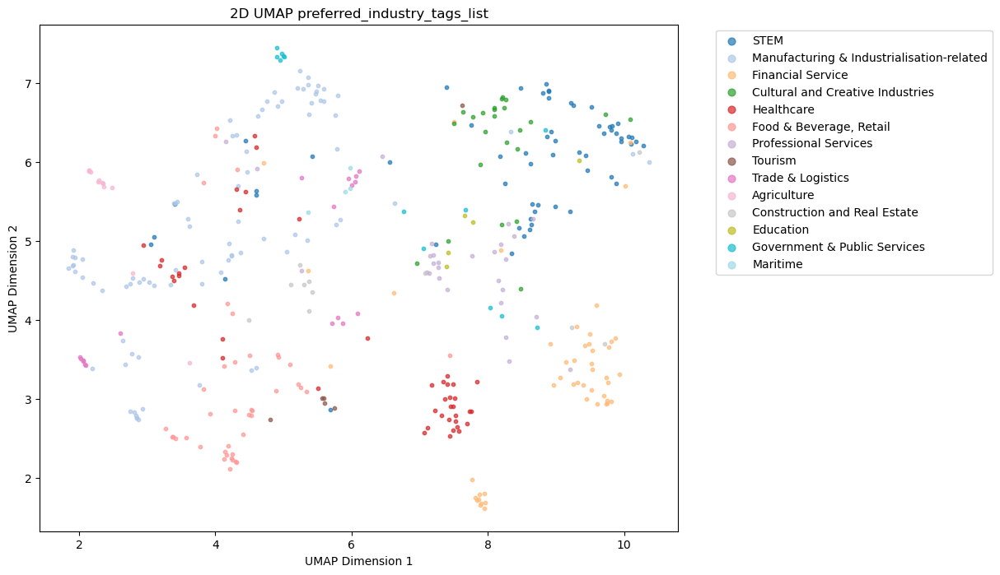

In [13]:
industry_embeddings


umap_model = umap.UMAP(n_components=2, random_state=42)
industry_embeddings_umap_2d = umap_model.fit_transform(industry_embeddings)

umap_model_3d = umap.UMAP(n_components=3, random_state=42)
industry_embeddings_umap_3d = umap_model_3d.fit_transform(industry_embeddings)

# Create a DataFrame with all 384 embedding dimensions for each industry, with industry/category/count columns first
industry_embeddings_umap_df = pd.DataFrame({
    'Industry': preferred_industry_count.preferred_industry_tags.values,
    'Category': preferred_industry_count['industries categories'].values,
    'Count': preferred_industry_count['count'].values
})
# Add embedding columns
for i in range(industry_embeddings.shape[1]):
    industry_embeddings_umap_df[f'embedding_{i}'] = industry_embeddings[:, i]

industry_embeddings_umap_df['2d_Dimension_1']= [embedding[0] for embedding in industry_embeddings_umap_2d]
industry_embeddings_umap_df['2d_Dimension_2']= [embedding[1] for embedding in industry_embeddings_umap_2d]
industry_embeddings_umap_df['3d_Dimension_1']= [embedding[0] for embedding in industry_embeddings_umap_3d]
industry_embeddings_umap_df['3d_Dimension_2']= [embedding[1] for embedding in industry_embeddings_umap_3d]
industry_embeddings_umap_df['3d_Dimension_3']= [embedding[2] for embedding in industry_embeddings_umap_3d]

plt.figure(figsize=(10, 8))
categories = industry_embeddings_umap_df['Category'].unique()
colors = plt.cm.get_cmap('tab20', len(categories))

for idx, category in enumerate(categories):
    subset = industry_embeddings_umap_df[industry_embeddings_umap_df['Category'] == category]
    plt.scatter(subset['2d_Dimension_1'], 
                subset['2d_Dimension_2'], 
                s=10, alpha=0.7, 
                label=category, 
                color=colors(idx))

plt.legend(markerscale=2, bbox_to_anchor=(1.05, 1), loc='upper left')



plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('2D UMAP preferred_industry_tags_list')
plt.show()



In [14]:
industry_embeddings_umap_df

,Industry,Category,Count,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,...,embedding_379,embedding_380,embedding_381,embedding_382,embedding_383,2d_Dimension_1,2d_Dimension_2,3d_Dimension_1,3d_Dimension_2,3d_Dimension_3
0,software,STEM,23058,-0.071273,0.022925,-0.014571,-0.039899,-0.020516,-0.051919,0.044214,...,0.055568,0.025446,-0.005229,0.078088,0.014576,9.949774,6.264977,12.573243,7.325923,2.701390
1,commercial products,Manufacturing & Industrialisation-related,7907,-0.032485,-0.024872,-0.000482,0.002792,0.032079,0.020750,0.084162,...,0.023445,-0.015926,-0.051797,0.116207,-0.008528,4.596937,3.401313,10.899482,7.532550,6.753990
2,other financial services,Financial Service,4705,-0.006406,-0.099743,-0.055705,0.000813,-0.013217,0.001551,0.053851,...,0.047965,0.029537,-0.115077,0.089820,0.045305,8.967731,3.175866,13.540875,8.428854,6.030353
3,media,Cultural and Creative Industries,4659,0.044520,0.011133,-0.013301,-0.024794,0.083836,0.052082,0.054593,...,0.035294,0.116821,0.019107,0.032248,0.088630,8.091937,6.588651,11.485945,8.279407,3.452230
4,healthcare,Healthcare,4515,-0.032356,0.088777,-0.003436,0.010857,-0.050009,0.049188,0.114996,...,0.040652,0.095689,-0.046973,0.080995,0.008606,7.428951,2.746660,11.981132,9.867838,6.029679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397,homeopathic products,Healthcare,1,-0.024226,-0.009245,-0.017500,0.021858,0.042722,0.012356,-0.015905,...,-0.000335,0.026336,-0.015294,0.160352,0.107282,4.106459,3.522552,10.306464,7.521513,7.105635
398,paper bags,Manufacturing & Industrialisation-related,1,-0.064929,0.105774,-0.030588,0.036481,0.025149,-0.111982,0.130173,...,0.066268,-0.017511,-0.026705,-0.005011,-0.011771,2.189860,3.385246,9.508714,7.136847,7.889229
399,global oil &amp,Manufacturing & Industrialisation-related,1,-0.084645,-0.023680,0.092094,0.032406,0.050962,0.007067,-0.023003,...,0.045518,0.000882,-0.065281,0.015952,-0.028149,4.869978,6.885140,8.919209,8.996530,4.520701
400,waste management,Manufacturing & Industrialisation-related,1,0.046237,0.074822,0.017637,0.005402,0.054885,-0.052059,0.123743,...,0.034953,0.139545,-0.008025,0.048349,-0.012099,6.633937,5.485591,12.281852,8.417372,5.064986


In [15]:
fig = px.scatter(
    industry_embeddings_umap_df,
    x="2d_Dimension_1",
    y="2d_Dimension_2",
    color="Category",
    hover_data=["Industry", "Count"]
)
fig.show()


In [16]:


fig = px.scatter_3d(
    industry_embeddings_umap_df, 
    x="3d_Dimension_1", 
    y="3d_Dimension_2", 
    z="3d_Dimension_3",
    hover_data=['Industry'],
    color='Category'
)
fig.show()
html_str = fig.to_html()
with open('industry_umap_3d.html', 'w') as f:
    f.write(html_str)

fig = px.scatter_3d(industry_embeddings_umap_df,
                     x="3d_Dimension_1", 
                     y="3d_Dimension_2", 
                     z="3d_Dimension_3",
                     hover_data='Industry',
                     size='Count',
                     color='Category'
# , color="species",size='petal_length'
                    )
fig.show()
html_str = fig.to_html()
with open('industry_umap_3d_size.html', 'w') as f:
    f.write(html_str)

## ML - Clustering

In [17]:
from sklearn.cluster import KMeans

### Geography Clustering 

In [107]:
geography_embeddings_umap_df

,Geography,Dimension_1,Dimension_2
1,united states,7.426336,-2.142599
2,europe,9.057121,-3.145132
3,canada,6.835590,-2.037454
4,north america,7.304031,-2.366180
5,asia,11.533536,-1.876656
...,...,...,...
3369,saudi arabia.,10.697309,-0.800912
3397,lesotho,10.021734,1.998306
3552,india.,10.518393,-1.364715
3629,africa and other regions.,10.465020,1.893452


In [111]:
n_clusters = 7
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
geography_embeddings_umap_df['Cluster row'] = kmeans.fit_predict(
    geography_embeddings_umap_df[['Dimension_1', 'Dimension_2']]
)

geography_embeddings_umap_df

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



,Geography,Dimension_1,Dimension_2,Cluster row
1,united states,7.426336,-2.142599,4
2,europe,9.057121,-3.145132,6
3,canada,6.835590,-2.037454,4
4,north america,7.304031,-2.366180,4
5,asia,11.533536,-1.876656,1
...,...,...,...,...
3369,saudi arabia.,10.697309,-0.800912,5
3397,lesotho,10.021734,1.998306,3
3552,india.,10.518393,-1.364715,1
3629,africa and other regions.,10.465020,1.893452,3


Find the optimal number of K for K-means using Elbow Method

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than 

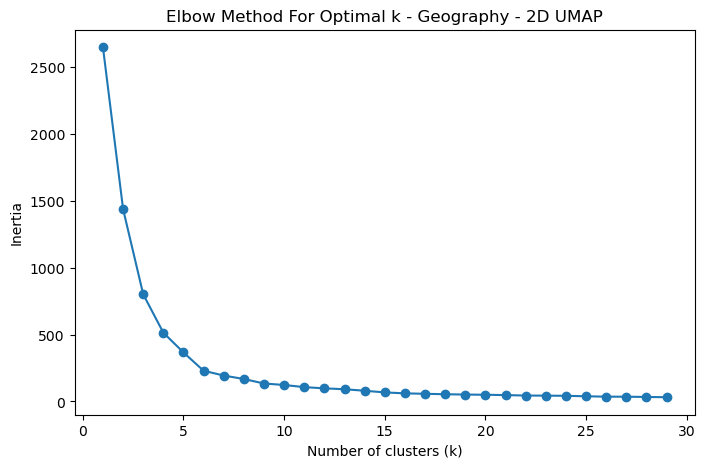

In [109]:
inertias = []
cluster_range = range(1, 30, 1)
for k in cluster_range:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias.append(
        kmeans_tmp.fit( geography_embeddings_umap_df[['Dimension_1', 'Dimension_2']] ).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - Geography - 2D UMAP')
plt.show()

### Investment Clustering 

In [100]:
investment_type_embeddings_umap_df

,investment_type,Dimension_1,Dimension_2
0,merger/acquisition,7.410641,10.144247
2,early stage vc,4.172321,9.670577
3,seed round,4.592599,8.969703
4,buyout/lbo,5.654512,8.778360
5,later stage vc,4.024254,9.517828
...,...,...,...
292,multi-line insurance,4.985423,11.715460
294,property and casualty insurance,5.229894,11.648980
302,leasing and others.,5.764440,10.543558
315,bank debt,8.037208,12.339093


In [101]:
n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
investment_type_embeddings_umap_df['Cluster row'] = kmeans.fit_predict(
    investment_type_embeddings_umap_df[['Dimension_1', 'Dimension_2']]
)

investment_type_embeddings_umap_df

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



,investment_type,Dimension_1,Dimension_2,Cluster row
0,merger/acquisition,7.410641,10.144247,2
2,early stage vc,4.172321,9.670577,3
3,seed round,4.592599,8.969703,3
4,buyout/lbo,5.654512,8.778360,1
5,later stage vc,4.024254,9.517828,3
...,...,...,...,...
292,multi-line insurance,4.985423,11.715460,7
294,property and casualty insurance,5.229894,11.648980,7
302,leasing and others.,5.764440,10.543558,5
315,bank debt,8.037208,12.339093,0


Find the optimal number of K for K-means using Elbow Method

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than 

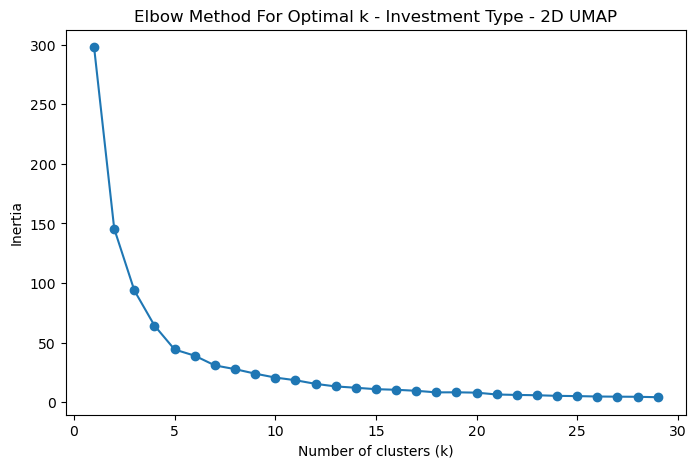

In [103]:
inertias = []
cluster_range = range(1, 30, 1)
for k in cluster_range:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias.append(
        kmeans_tmp.fit( investment_type_embeddings_umap_df[['Dimension_1', 'Dimension_2']] ).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - Investment Type - 2D UMAP')
plt.show()

### Industry Clustering 

In [18]:
industry_embeddings_umap_df

,Industry,Category,Count,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,...,embedding_379,embedding_380,embedding_381,embedding_382,embedding_383,2d_Dimension_1,2d_Dimension_2,3d_Dimension_1,3d_Dimension_2,3d_Dimension_3
0,software,STEM,23058,-0.071273,0.022925,-0.014571,-0.039899,-0.020516,-0.051919,0.044214,...,0.055568,0.025446,-0.005229,0.078088,0.014576,9.949774,6.264977,12.573243,7.325923,2.701390
1,commercial products,Manufacturing & Industrialisation-related,7907,-0.032485,-0.024872,-0.000482,0.002792,0.032079,0.020750,0.084162,...,0.023445,-0.015926,-0.051797,0.116207,-0.008528,4.596937,3.401313,10.899482,7.532550,6.753990
2,other financial services,Financial Service,4705,-0.006406,-0.099743,-0.055705,0.000813,-0.013217,0.001551,0.053851,...,0.047965,0.029537,-0.115077,0.089820,0.045305,8.967731,3.175866,13.540875,8.428854,6.030353
3,media,Cultural and Creative Industries,4659,0.044520,0.011133,-0.013301,-0.024794,0.083836,0.052082,0.054593,...,0.035294,0.116821,0.019107,0.032248,0.088630,8.091937,6.588651,11.485945,8.279407,3.452230
4,healthcare,Healthcare,4515,-0.032356,0.088777,-0.003436,0.010857,-0.050009,0.049188,0.114996,...,0.040652,0.095689,-0.046973,0.080995,0.008606,7.428951,2.746660,11.981132,9.867838,6.029679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397,homeopathic products,Healthcare,1,-0.024226,-0.009245,-0.017500,0.021858,0.042722,0.012356,-0.015905,...,-0.000335,0.026336,-0.015294,0.160352,0.107282,4.106459,3.522552,10.306464,7.521513,7.105635
398,paper bags,Manufacturing & Industrialisation-related,1,-0.064929,0.105774,-0.030588,0.036481,0.025149,-0.111982,0.130173,...,0.066268,-0.017511,-0.026705,-0.005011,-0.011771,2.189860,3.385246,9.508714,7.136847,7.889229
399,global oil &amp,Manufacturing & Industrialisation-related,1,-0.084645,-0.023680,0.092094,0.032406,0.050962,0.007067,-0.023003,...,0.045518,0.000882,-0.065281,0.015952,-0.028149,4.869978,6.885140,8.919209,8.996530,4.520701
400,waste management,Manufacturing & Industrialisation-related,1,0.046237,0.074822,0.017637,0.005402,0.054885,-0.052059,0.123743,...,0.034953,0.139545,-0.008025,0.048349,-0.012099,6.633937,5.485591,12.281852,8.417372,5.064986


In [79]:
# Choose the number of clusters, e.g., 5
n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
industry_embeddings_umap_df['Cluster_2d_KMeans'] = kmeans.fit_predict(
    industry_embeddings_umap_df[['2d_Dimension_1', '2d_Dimension_2']]
)

industry_embeddings_umap_df

# Choose the number of clusters, e.g., 5
n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
industry_embeddings_umap_df['Cluster_3d_KMeans'] = kmeans.fit_predict(
    industry_embeddings_umap_df[['3d_Dimension_1', '3d_Dimension_2', '3d_Dimension_3']]
)

industry_embeddings_umap_df


# Choose the number of clusters, e.g., 5
n_clusters = 350
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
industry_embeddings_umap_df['Cluster_384d_KMeans'] = kmeans.fit_predict(
    industry_embeddings_umap_df[list([col for col in industry_embeddings_umap_df.columns if col.startswith('embedding_')])]
)



industry_embeddings_umap_df



c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



,Industry,Category,Count,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,embedding_100,embedding_101,embedding_102,embedding_103,embedding_104,embedding_105,embedding_106,embedding_107,embedding_108,embedding_109,embedding_110,embedding_111,embedding_112,embedding_113,embedding_114,embedding_115,embedding_116,embedding_117,embedding_118,embedding_119,embedding_120,embedding_121,embedding_122,embedding_123,embedding_124,...,embedding_264,embedding_265,embedding_266,embedding_267,embedding_268,embedding_269,embedding_270,embedding_271,embedding_272,embedding_273,embedding_274,embedding_275,embedding_276,embedding_277,embedding_278,embedding_279,embedding_280,embedding_281,embedding_282,embedding_283,embedding_284,embedding_285,embedding_286,embedding_287,embedding_288,embedding_289,embedding_290,embedding_291,embedding_292,embedding_293,embedding_294,embedding_295,embedding_296,embedding_297,embedding_298,embedding_299,embedding_300,embedding_301,embedding_302,embedding_303,embedding_304,embedding_305,embedding_306,embedding_307,embedding_308,embedding_309,embedding_310,embedding_311,embedding_312,embedding_313,embedding_314,embedding_315,embedding_316,embedding_317,embedding_318,embedding_319,embedding_320,embedding_321,embedding_322,embedding_323,embedding_324,embedding_325,embedding_326,embedding_327,embedding_328,embedding_329,embedding_330,embedding_331,embedding_332,embedding_333,embedding_334,embedding_335,embedding_336,embedding_337,embedding_338,embedding_339,embedding_340,embedding_341,embedding_342,embedding_343,embedding_344,embedding_345,embedding_346,embedding_347,embedding_348,embedding_349,embedding_350,embedding_351,embedding_352,embedding_353,embedding_354,embedding_355,embedding_356,embedding_357,embedding_358,embedding_359,embedding_360,embedding_361,embedding_362,embedding_363,embedding_364,embedding_365,embedding_366,embedding_367,embedding_368,embedding_369,embedding_370,embedding_371,embedding_372,embedding_373,embedding_374,embedding_375,embedding_376,embedding_377,embedding_378,embedding_379,embedding_380,embedding_381,embedding_382,embedding_383,2d_Dimension_1,2d_Dimension_2,3d_Dimension_1,3d_Dimension_2,3d_Dimension_3,Cluster_2d_KMeans,Cluster_3d_KMeans,Cluster_384d_KMeans
0,software,STEM,23058,-0.071273,0.022925,-0.014571,-0.039899,-0.020516,-0.051919,0.044214,0.097293,0.032350,0.016198,-0.033038,0.014155,0.037107,-0.031185,-0.000053,0.005487,-0.034040,0.008597,-0.005649,-0.112667,-0.043178,-0.020232,-0.057749,0.017974,0.048932,0.054982,-0.010980,0.008590,0.071325,-0.093994,0.006697,0.050239,0.117200,-0.009143,-0.051832,0.002397,-0.026420,-0.048227,-0.084410,-0.061013,-0.104064,-0.026323,-0.003841,-0.029446,0.036117,-0.077481,-0.033726,0.019678,0.018434,0.052471,-0.104529,-0.055619,

Find the optimal number of K for K-means using Elbow Method

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than 

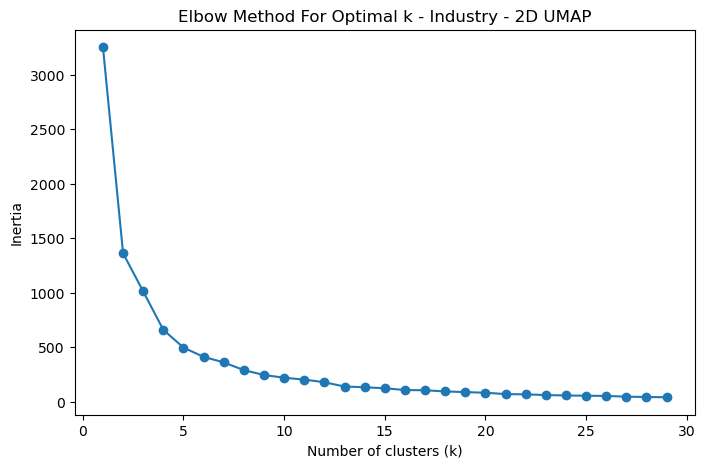

In [104]:
inertias = []
cluster_range = range(1, 30, 1)
for k in cluster_range:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias.append(
        kmeans_tmp.fit( industry_embeddings_umap_df[['2d_Dimension_1', '2d_Dimension_2']] ).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - Industry - 2D UMAP')
plt.show()

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than 

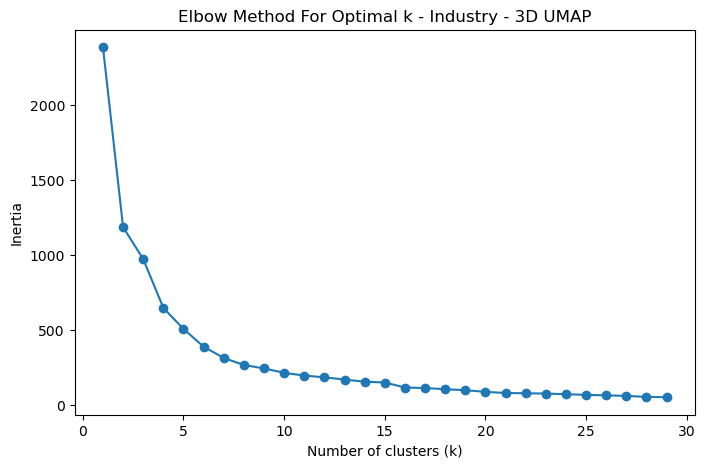

In [105]:
inertias = []
cluster_range = range(1, 30, 1)
for k in cluster_range:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias.append(
        kmeans_tmp.fit( industry_embeddings_umap_df[['3d_Dimension_1', '3d_Dimension_2', '3d_Dimension_3']] ).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - Industry - 3D UMAP')
plt.show()

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\leung\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than 

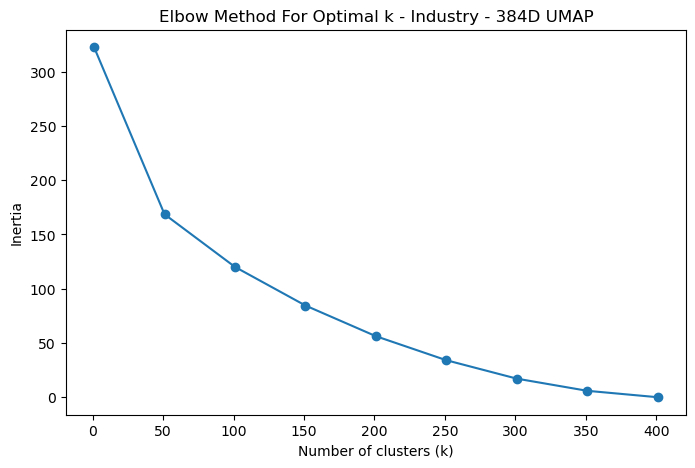

In [106]:
inertias = []
cluster_range = range(1, 450, 50)
for k in cluster_range:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias.append(
        kmeans_tmp.fit( industry_embeddings_umap_df[list([col for col in industry_embeddings_umap_df.columns if col.startswith('embedding_')])] ).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - Industry - 384D UMAP')
plt.show()

#### 2d

In [20]:
fig = px.scatter(
    industry_embeddings_umap_df,
    x="2d_Dimension_1",
    y="2d_Dimension_2",
    color="Cluster_2d_KMeans",
    hover_data=["Industry", "Count"],
)
fig.show()
# fig = px.scatter(
#     industry_embeddings_umap_df,
#     x="2d_Dimension_1",
#     y="2d_Dimension_2",
#     color="Cluster_3d_KMeans",
#     hover_data=["Industry", "Count"],
    
# )

# fig.show()

In [21]:
fig = px.scatter(
    industry_embeddings_umap_df,
    x="2d_Dimension_1",
    y="2d_Dimension_2",
    color="Cluster_384d_KMeans",
    hover_data=["Industry", "Count"],
)
fig.show()


#### 3d

In [22]:
fig = px.scatter_3d(
    industry_embeddings_umap_df, 
    x="3d_Dimension_1", 
    y="3d_Dimension_2", 
    z="3d_Dimension_3",
    hover_data=['Industry'],
    color='Cluster_2d_KMeans'
)
fig.show()
html_str = fig.to_html()
with open('industry_umap_3d.html', 'w') as f:
    f.write(html_str)

fig = px.scatter_3d(industry_embeddings_umap_df,
                     x="3d_Dimension_1", 
                     y="3d_Dimension_2", 
                     z="3d_Dimension_3",
                     hover_data='Industry',
                     size='Count',
                     color='Cluster_3d_KMeans'
# , color="species",size='petal_length'
                    )
fig.show()
html_str = fig.to_html()
with open('industry_umap_3d_size.html', 'w') as f:
    f.write(html_str)

    


fig = px.scatter_3d(
    industry_embeddings_umap_df, 
    x="3d_Dimension_1", 
    y="3d_Dimension_2", 
    z="3d_Dimension_3",
    hover_data=['Industry'],
    color='Cluster_384d_KMeans'
)
fig.show()
html_str = fig.to_html()
with open('industry_umap_384d.html', 'w') as f:
    f.write(html_str)

In [23]:
industry_embeddings_umap_df.sort_values(by='Cluster_384d_KMeans', ascending=False)

,Industry,Category,Count,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,...,embedding_382,embedding_383,2d_Dimension_1,2d_Dimension_2,3d_Dimension_1,3d_Dimension_2,3d_Dimension_3,Cluster_2d_KMeans,Cluster_3d_KMeans,Cluster_384d_KMeans
68,music and entertainment,Cultural and Creative Industries,580,0.051423,-0.021630,0.014106,-0.015545,-0.037485,0.104032,0.096093,...,0.042735,0.003130,7.965137,6.383368,11.307117,8.213605,3.448650,6,3,9
311,internet publishing,Cultural and Creative Industries,1,-0.016480,-0.040840,-0.023606,0.010265,-0.046853,-0.011835,-0.044231,...,0.011943,0.028294,8.467940,6.407773,11.914579,8.275588,3.323032,6,3,9
142,broadcasting,Cultural and Creative Industries,159,0.015708,-0.011463,-0.017909,-0.005289,0.076450,0.048921,0.061094,...,-0.049347,0.042500,8.214986,6.821765,11.441106,8.139393,3.304698,6,3,9
141,radio and television,Cultural and Creative Industries,159,0.070569,0.003718,-0.046629,-0.023985,0.011252,0.058282,0.028805,...,-0.017785,0.013394,8.207012,6.806323,11.412971,8.108140,3.273556,6,3,9
290,media production,Cultural and Creative Industries,2,0.016810,-0.049802,-0.020909,-0.025378,0.042175,0.025965,-0.005675,...,0.087683,0.047558,8.091581,6.692555,11.490902,8.302437,3.375491,6,3,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,other energy services,Manufacturing & Industrialisation-related,318,-0.047488,-0.023605,0.031274,0.024915,0.057532,-0.017179,0.014267,...,0.009298,0.041280,5.238745,7.161351,8.981735,8.641918,4.227317,0,0,0
27,minerals and mining,Manufacturing & Industrialisation-related,1925,-0.041030,0.048289,-0.007365,0.078472,0.047329,-0.037399,0.091127,...,0.070136,-0.092255,1.898375,4.803998,8.290700,6.595971,6.601195,8,2,0
150,energy transportation,Manufacturing & Industrialisation-related,144,-0.027204,0.042968,0.027621,0.086943,0.002892,-0.030576,0.120336,...,0.020011,0.007600,5.753545,6.592280,9.442111,8.466582,4.329851,0,0,0
162,other utilities,Government & Public Services,130,-0.060136,0.005151,0.012889,0.025291,0.055490,-0.013193,0.027791,...,0.091142,0.016680,4.974509,7.377279,8.524946,8.640202,4.231547,0,0,0


Recommendation of ( Geography, Investment Type, Industry) based on K-means clustering result, since investor may choose one of those.

* geography

In [112]:
geography_cluster_group = geography_embeddings_umap_df.groupby('Cluster row')['Geography'].apply(list)
print( geography_cluster_group )
geography_cluster_group.to_csv('tags_geography_by_cluster.csv')

Cluster row
0    [california, new york, texas, florida, souther...
1    [asia, india, china, southeast asia, japan, si...
2    [australia, oceania, new zealand, us territori...
3    [africa, northern africa, eastern africa, sout...
4    [united states, canada, north america, united ...
5    [israel, united arab emirates, saudi arabia, e...
6    [europe, germany, france, western europe, swit...
Name: Geography, dtype: object


* ivnestment type

In [114]:
investment_cluster_group = investment_type_embeddings_umap_df.groupby('Cluster row')['investment_type'].apply(list)
print( investment_cluster_group )
investment_cluster_group.to_csv('tags_investment_by_cluster.csv')

Cluster row
0    [debt - general, senior debt, subordinated deb...
1    [buyout/lbo, carveout, secondary transaction -...
2    [merger/acquisition, management buy-in, corpor...
3    [early stage vc, seed round, later stage vc, a...
4    [convertible debt, bonds, capitalization, bond...
5    [grant, bridge, sale-lease back facility, vent...
6    [pe growth/expansion, management buyout, joint...
7    [insurance, other insurance, life and health i...
8    [recapitalization, leveraged recapitalization,...
9    [acquisition financing, loan, distressed acqui...
Name: investment_type, dtype: object


* industry

In [ ]:
industry_cluster_group = industry_embeddings_umap_df.groupby('Cluster_2d_KMeans')['Industry'].apply(list)
print( industry_cluster_group )
industry_cluster_group.to_csv('tags_industry_by_cluster.csv')

Cluster_2d_KMeans
0    [energy, transportation, commercial transporta...
1    [it services, business products and services (...
2    [healthcare devices and supplies, computer har...
3    [healthcare, healthcare services, healthcare t...
4    [other financial services, financial services,...
5    [materials and resources, containers and packa...
6    [software, media, information technology, othe...
7    [commercial products, retail, consumer non-dur...
8    [pharmaceuticals and biotechnology, agricultur...
9    [hotels and leisure, restaurants, distributors...
Name: Industry, dtype: object


### Record Clustering --> List of Investors in Cluster and their Main Preference in 3 Tags

In [25]:
pd.set_option('display.max_columns', 257)
print(dataset_encoded_3.columns.tolist())

['Investors', 'Description', 'Geography', 'Preferred Industry', 'Preferred Investment Type', 'Primary Investor Type', 'geography_tags', 'preferred_investment_type_tags', 'preferred_industry_tags', 'Geography Categories_by countries_Afghanistan', 'Geography Categories_by countries_Africa', 'Geography Categories_by countries_Africa And Other Regions', 'Geography Categories_by countries_Albania', 'Geography Categories_by countries_Algeria', 'Geography Categories_by countries_Americas', 'Geography Categories_by countries_Andorra', 'Geography Categories_by countries_Angola', 'Geography Categories_by countries_Antigua and Barbuda', 'Geography Categories_by countries_Argentina', 'Geography Categories_by countries_Armenia', 'Geography Categories_by countries_Aruba', 'Geography Categories_by countries_Asia', 'Geography Categories_by countries_Australia', 'Geography Categories_by countries_Austria', 'Geography Categories_by countries_Azerbaijan', 'Geography Categories_by countries_Bahamas', 'Geo

In [26]:
exclude_cols = [
    'Investors',
    'Description',
    'Geography',
    'Preferred Industry',
    'Preferred Investment Type',
    'geography_tags',
    'preferred_investment_type_tags',
    'preferred_industry_tags',
    'Primary Investor Type'
]


In [27]:

n_clusters = 40
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
org_cols = [
    'Investors',
    'Description',
    'Geography',
    'Preferred Industry',
    'Preferred Investment Type',
    'geography_tags',
    'preferred_investment_type_tags',
    'preferred_industry_tags',
    'Primary Investor Type'
]
dataset_encoded_3_cluster = dataset_encoded_3.copy()
dataset_encoded_3_cluster['Cluster_row'] = kmeans.fit_predict(
    dataset_encoded_3_cluster[[col for col in dataset_encoded_3_cluster.columns if col not in org_cols] ]
)
dataset_encoded_3_cluster

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

Find the optimal number of K for K-means using Elbow Method --> k = 40

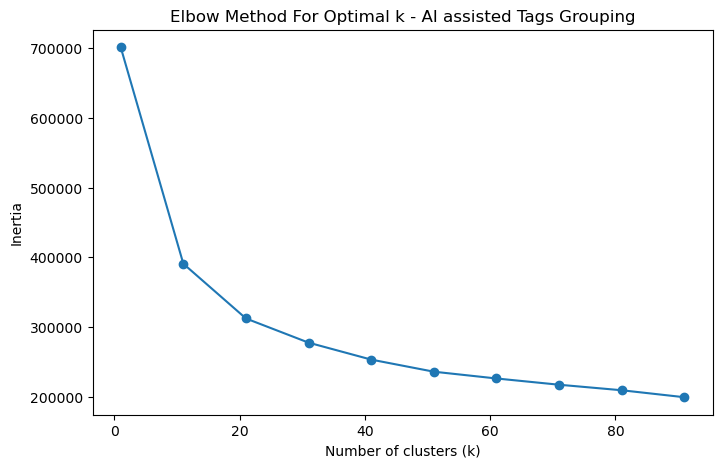

In [52]:
inertias_record_cluster = []
cluster_range_record_cluster = range(1, 100, 10)
for k in cluster_range_record_cluster:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias_record_cluster.append(
        kmeans_tmp.fit(dataset_encoded_3[[col for col in dataset_encoded_3.columns if col not in org_cols]]).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range_record_cluster, inertias_record_cluster, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - AI assisted Tags Grouping')
plt.show()

List of Investors in the same cluster

In [97]:
investors_by_cluster = dataset_encoded_3_cluster.groupby('Cluster_row')['Investors'].apply(list)
print( investors_by_cluster)
investors_by_cluster.to_csv('investors_by_cluster.csv')

Cluster_row
0     [The Carlyle Group (NAS: CG), TA Associates Ma...
1     [Wallonie Entreprendre, Alliance Automotive Gr...
2     [Altas Partners, Novo Holdings, Sandeep Nailwa...
3     [Soma Capital, Precursor Ventures, Index Ventu...
4     [Tech Incubator Program for Startups, National...
5     [Animoca Brands, Rubicon Technology Partners, ...
6     [National Institutes of Health, Redesign Healt...
7     [Bpifrance, University of Toronto Entrepreneur...
8     [CVC Capital Partners (AMS: CVC), IndieBio, Br...
9     [Ares Management (NYS: ARES), BGF (Financial S...
10    [EQT (STO: EQT), Impact Assets, Intermediate C...
11    [Goldman Sachs Asset Management, MassChallenge...
12    [US LBM Holdings, Beacon Roofing Supply (NAS: ...
13    [Gaingels, Alumni Ventures, Pioneer Fund, gene...
14    [BlackRock (NYS: BLK), Bossa Invest, CPP Inves...
15    [Leonard Green &amp, Shore Capital Partners, M...
16    [Volaris Group, Cox Enterprises, Isengard Capi...
17    [J2 Partners, Jack Lingo Asset

#### Find the main preference (Geography, Investment Types or Industries) of each cluster.  

In [29]:
dataset_encoded_3_cluster[[col for col in dataset_encoded_3_cluster.columns if col not in org_cols] ]

,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geography Categories_by countries_Jordan,Geography Categories_by countries_Kazakhstan,Geography Categories_by countries_Kenya,Geography Categories_by countries_Kiribati,Geo

group by each cluster and find their mean value by column

In [30]:
record_cluster = dataset_encoded_3_cluster[[col for col in dataset_encoded_3_cluster.columns if col not in org_cols] ].groupby('Cluster_row').mean().sort_values(by='Cluster_row', ascending=True)
record_cluster

,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geography Categories_by countries_Jordan,Geography Categories_by countries_Kazakhstan,Geography Categories_by countries_Kenya,Geography Categories_by countries_Kiribati,Geo

In [31]:
record_cluster_geography = record_cluster.loc[:,'Geography Categories_by countries_Afghanistan':'Geography Categories_by countries_Zimbabwe']
record_cluster_ivnestment = record_cluster.loc[:,'Investment Categories_Accelerator/incubator':'Investment Categories_Venture capital & private equity']
record_cluster_industry = record_cluster.loc[:,'industries categories_Agriculture':'industries categories_Trade & Logistics']

Cluster main preference in Geography, Investment, Industry by Top 3

In [32]:
def top_3_values(row):
   return row.nlargest(3)

top_3_cluster_geography = record_cluster_geography.apply(top_3_values, axis=1)
top_3_cluster_investment = record_cluster_ivnestment.apply(top_3_values, axis=1)
top_3_cluster_industry = record_cluster_industry.apply(top_3_values, axis=1)

top_3_cluster_industry

,industries categories_Agriculture,industries categories_Construction and Real Estate,industries categories_Cultural and Creative Industries,industries categories_Education,industries categories_Financial Service,"industries categories_Food & Beverage, Retail",industries categories_Healthcare,industries categories_Manufacturing & Industrialisation-related,industries categories_Maritime,industries categories_Not Relevant,industries categories_Not Specific,industries categories_Professional Services,industries categories_STEM,industries categories_Tourism,industries categories_Trade & Logistics
Cluster_row,,,,,,,,,,,,,,,
0,NaN,NaN,NaN,NaN,NaN,NaN,0.689741,0.886572,NaN,NaN,NaN,NaN,1.059216,NaN,NaN
1,NaN,0.000613,NaN,NaN,0.000988,NaN,NaN,NaN,NaN,1.000068,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,0.000196,NaN,NaN,NaN,0.000391,NaN,1.002639,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,1.317124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.348163,1.055872,NaN,NaN
4,NaN,NaN,NaN,NaN,0.409717,NaN,0.422770,NaN,NaN,NaN,NaN,NaN,3.963742,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,0.048898,NaN,NaN,NaN,NaN,0.046143,NaN,1.356290,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,0.061395,1.429763,0.054320,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,5.582645,2.611570,NaN,NaN,NaN,NaN,NaN,4.090909,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.898477,NaN,NaN,NaN,NaN,0.391878,NaN,0.497462


In [33]:
for i in range(0, 40):
    print(f"Cluster {i}:")
    print( top_3_cluster_geography.loc[i, : ].dropna().sort_values(ascending=False).reset_index()['index'].values.tolist() )
    print( top_3_cluster_investment.loc[ i, : ].dropna().sort_values(ascending=False).reset_index()['index'].values.tolist() )
    print( top_3_cluster_industry.loc[ i, : ].dropna().sort_values(ascending=False).reset_index()['index'].values.tolist() )
    print("\n")

Cluster 0:
['Geography Categories_by countries_United States', 'Geography Categories_by countries_Europe', 'Geography Categories_by countries_Canada']
['Investment Categories_Buyout', 'Investment Categories_Private equity', 'Investment Categories_Mergers and acquisitions']
['industries categories_STEM', 'industries categories_Manufacturing & Industrialisation-related', 'industries categories_Healthcare']


Cluster 1:
['Geography Categories_by countries_United States', 'Geography Categories_by countries_Europe', 'Geography Categories_by countries_Not Relevant']
['Investment Categories_Mergers and acquisitions', 'Investment Categories_Debt', 'Investment Categories_Private equity']
['industries categories_Not Relevant', 'industries categories_Financial Service', 'industries categories_Construction and Real Estate']


Cluster 2:
['Geography Categories_by countries_Not Relevant', 'Geography Categories_by countries_United States', 'Geography Categories_by countries_Europe']
['Investment Cate

### Association Rules

##### **Across the 3 tag columns**

In [34]:
dataset_encoded_3.loc[(dataset_encoded_3.select_dtypes(include='int').ge(2)).any(axis=1)]

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

Dropped Column 'Cluster_row'

In [122]:
data_for_association

,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geography Categories_by countries_Jordan,Geography Categories_by countries_Kazakhstan,Geography Categories_by countries_Kenya,Geography Categories_by countries_Kiribati,Geo

In [35]:
from mlxtend.frequent_patterns import apriori, association_rules

# Select the columns for association rule mining
data_for_association = dataset_encoded_3_cluster[[col for col in dataset_encoded_3_cluster.columns if col not in org_cols]].drop(columns=['Cluster_row']).applymap(lambda x: 1 if x > 0 else 0)

# Find frequent itemsets
frequent_itemsets = apriori(data_for_association, min_support=0.05, use_colnames=True)

# Generate association rules
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1.0)

rules_sorted = rules.sort_values('lift', ascending=False)
rules_sorted

C:\Users\leung\AppData\Local\Temp\ipykernel_13332\1767959388.py:4: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.

c:\Users\leung\anaconda3\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
25,(Investment Categories_Not relevant),"(Investment Categories_Buyout, Investment Cate...",0.092378,0.071589,0.058741,0.635873,8.882207,1.0,0.052127,2.549686,0.977737,0.558229,0.607795,0.728197
24,"(Investment Categories_Buyout, Investment Cate...",(Investment Categories_Not relevant),0.071589,0.092378,0.058741,0.820521,8.882207,1.0,0.052127,5.056973,0.955844,0.558229,0.802253,0.728197
26,(Investment Categories_Buyout),"(Investment Categories_Not relevant, Investmen...",0.139363,0.059298,0.058741,0.421493,7.108011,1.0,0.050477,1.626086,0.998463,0.419813,0.385026,0.706044
23,"(Investment Categories_Not relevant, Investmen...",(Investment Categories_Buyout),0.059298,0.139363,0.058741,0.990595,7.108011,1.0,0.050477,91.510604,0.913482,0.419813,0.989072,0.706044
0,(Investment Categories_Not relevant),(Investment Categories_Buyout),0.092378,0.139363,0.080498,0.871396,6.252695,1.0,0.067624,6.692129,0.925571,0.532240,0.850571,0.724504
1,(Investment Categories_Buyout),(Investment Categories_Not relevant),0.139363,0.092378,0.080498,0.577612,6.252695,1.0,0.067624,2.148785,0.976102,0.532240,0.534621,0.724504
29,"(industries categories_STEM, Investment Catego...",(Investment Categories_Seed round),0.103304,0.144060,0.089553,0.866885,6.017544,1.0,0.074671,6.430059,0.929880,0.567470,0.844480,0.744261
32,(Investment Categories_Seed round),"(industries categories_STEM, Investment Catego...",0.144060,0.103304,0.089553,0.621638,6.017544,1.0,0.074671,2.369942,0.974156,0.567470,0.578049,0.744261
12,(Investment Categories_Venture capital),(Investment Categories_Seed round),0.175848,0.144060,0.141499,0.804665,5.585645,1.0,0.116166,4.381918,0.996138,0.793115,0.771789,0.893444
13,(Investment Categories_Seed round),(Investment Categories_Venture capital),0.144060,0.175848,0.141499,0.982223,5.585645,1.0,0.116166,46.360337,0.959143,0.793115,0.978430,0.893444


remove 'Not relevant' and 'Not Specific' in any association

In [36]:
# Check if 'Not relevant' or 'Not Specific' exist in any cell
mask = rules_sorted.apply(lambda col: col.astype(str).str.contains('Not relevant|Not Specific', case=False, na=False))
if mask.any().any():
    print("Found 'Not relevant' or 'Not Specific' in the DataFrame.")

# Drop rows where any cell contains 'Not relevant' or 'Not Specific'
rules_filtered = rules_sorted[~mask.any(axis=1)]
rules_filtered

Found 'Not relevant' or 'Not Specific' in the DataFrame.


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
29,"(industries categories_STEM, Investment Catego...",(Investment Categories_Seed round),0.103304,0.144060,0.089553,0.866885,6.017544,1.0,0.074671,6.430059,0.929880,0.567470,0.844480,0.744261
32,(Investment Categories_Seed round),"(industries categories_STEM, Investment Catego...",0.144060,0.103304,0.089553,0.621638,6.017544,1.0,0.074671,2.369942,0.974156,0.567470,0.578049,0.744261
12,(Investment Categories_Venture capital),(Investment Categories_Seed round),0.175848,0.144060,0.141499,0.804665,5.585645,1.0,0.116166,4.381918,0.996138,0.793115,0.771789,0.893444
13,(Investment Categories_Seed round),(Investment Categories_Venture capital),0.144060,0.175848,0.141499,0.982223,5.585645,1.0,0.116166,46.360337,0.959143,0.793115,0.978430,0.893444
33,(Investment Categories_Venture capital),"(industries categories_STEM, Investment Catego...",0.175848,0.091211,0.089553,0.509264,5.583343,1.0,0.073514,1.851889,0.996049,0.504506,0.460011,0.745541
28,"(industries categories_STEM, Investment Catego...",(Investment Categories_Venture capital),0.091211,0.175848,0.089553,0.981818,5.583343,1.0,0.073514,45.328375,0.903286,0.504506,0.977939,0.745541
3,(Investment Categories_Buyout),(Investment Categories_Private equity),0.139363,0.080557,0.059907,0.429865,5.336194,1.0,0.048681,1.612677,0.944185,0.374392,0.379913,0.586767
2,(Investment Categories_Private equity),(Investment Categories_Buyout),0.080557,0.139363,0.059907,0.743669,5.336194,1.0,0.048681,3.357523,0.883796,0.374392,0.702161,0.586767
14,(industries categories_STEM),(Investment Categories_Seed round),0.246263,0.144060,0.091211,0.370381,2.571030,1.0,0.055735,1.359459,0.810695,0.304941,0.264413,0.501766
15,(Investment Categories_Seed round),(industries categories_STEM),0.144060,0.246263,0.091211,0.633150,2.571030,1.0,0.055735,2.054618,0.713894,0.304941,0.513292,0.501766


##### **Between "Primary investor Type & Preferred Investment Type"**

In [160]:
primary_investor_type_encode = dataset_encoded_3[['Investors', 'Primary Investor Type']]
primary_investor_type_encode = pd.get_dummies(primary_investor_type_encode, columns=['Primary Investor Type'])
primary_investor_type_encode

,Investors,Primary Investor Type_ Applications and video online,Primary Investor Type_ Ashburton Gold,Primary Investor Type_ Board Member at ReferReach.,Primary Investor Type_ Bridal Veil,Primary Investor Type_ Bulgaria,Primary Investor Type_ Dissimieux,Primary Investor Type_ Foreign Employment Term,Primary Investor Type_ Infrastructure Upgrades,Primary Investor Type_ Investor at Gera dovana.,Primary Investor Type_ Koongulla,Primary Investor Type_ Ninghan and Mt Edon.,Primary Investor Type_ PCR series,Primary Investor Type_ Property investment,Primary Investor Type_ among others.,Primary Investor Type_ and Metelen River tenements.,Primary Investor Type_ and actready to plan,Primary Investor Type_ and apple tv,Primary Investor Type_ and travel.,Primary Investor Type_ antihistamine drugs,Primary Investor Type_ astir,Primary Investor Type_ big data insights,Primary Investor Type_ co (investments &amp,Primary Investor Type_ ear training,Primary Investor Type_ eco,Primary Investor Type_ financial services,Primary Investor Type_ funding,Primary Investor Type_ getaround,Primary Investor Type_ guarantee services,Primary Investor Type_ impact,Primary Investor Type_ insurance,Primary Investor Type_ insurance brokerage,Primary Investor Type_ kajoos,Primary Investor Type_ marketpalce sales,Primary Investor Type_ medical devices,Primary Investor Type_ moonshot academy beijing,Primary Investor Type_ no installation is needed.,Primary Investor Type_ provide mentorship,Primary Investor Type_ steel cans,Primary Investor Type_ successful entrepreneurs,Primary Investor Type_ tower infrastructure services,Primary Investor Type_'cloud architect',Primary Investor Type_0,Primary Investor Type_<span>0.00 - 0.01</span>,Primary Investor Type_<span>0.00 - 0.10</span>,Primary Investor Type_<span>0.00 - 0.31</span>,Primary Investor Type_<span>0.00 - 0.52</span>,Primary Investor Type_<span>0.00 - 1.00</span>,Primary Investor Type_<span>0.00 - 1.25</span>,Primary Investor Type_<span>0.00 - 10.00</span>,Primary Investor Type_<span>0.00 - 10.35</span>,Primary Investor Type_<span>0.00 - 100.00</span>,Primary Investor Type_<span>0.00 - 11.38</span>,Primary Investor Type_<span>0.00 - 124.21</span>,Primary Investor Type_<span>0.00 - 16.56</span>,Primary Investor Type_<span>0.00 - 2.00</span>,Primary Investor Type_<span>0.00 - 2.07</span>,Primary Investor Type_<span>0.00 - 2.47</span>,Primary Investor Type_<span>0.00 - 20.00</span>,Primary Investor Type_<span>0.00 - 20.70</span>,Primary Investor Type_<span>0.00 - 206.96</span>,Primary Investor Type_<span>0.00 - 25.87</span>,Primary Investor Type_<span>0.00 - 250.00</span>,Primary Investor Type_<span>0.00 - 258.84</span>,Primary Investor Type_<span>0.00 - 31.04</span>,Primary Investor Type_<span>0.00 - 4.14</span>,Primary Investor Type_<span>0.00 - 5.00</span>,Primary Investor Type_<span>0.00 - 51.74</span>,Primary Investor Type_<span>0.00 - 51.77</span>,Primary Investor Type_<span>0.00 - 6.17</span>,Primary Investor Type_<span>0.00 - 7.00</span>,Primary Investor Type_<span>0.00</span>,Primary Investor Type_<span>0.01 - 0.00</span>,Primary Investor Type_<span>0.01 - 0.02</span>,Primary Investor Type_<span>0.01 - 0.03</span>,Primary Investor Type_<span>0.01 - 0.04</span>,Primary Investor Type_<span>0.01 - 0.05</span>,Primary Investor Type_<span>0.01 - 0.06</span>,Primary Investor Type_<span>0.01 - 0.07</span>,Primary Investor Type_<span>0.01 - 0.10</span>,Primary Investor Type_<span>0.01 - 0.12</span>,Primary Investor Type_<span>0.01 - 0.13</span>,Primary Investor Type_<span>0.01 - 0.14</span>,Primary Investor Type_<span>0.01 - 0.15</span>,Primary Investor Type_<span>0.01 - 0.17</span>,Primary Investor Type_<span>0.01 - 0.21</span>,Primary Investor Type_<span>0.01 - 0.23</span>,Primary Investor Type_<span>0.01 - 0.25</span>,Primary Investor Type_<span>0.01 - 0.26</span>,Primary Investor Type_<span>0.01 - 0.27</span>,Primary Investor Type_<span>0.01 - 0.30</span>,Primary Investor Type_<span>0.01 - 0.31</span>,Primary

In [158]:
investment_encode = data_for_association.loc[: , 'Investment Categories_Accelerator/incubator':'Investment Categories_Venture capital & private equity']

In [159]:
primaryinvestor_investment_encode = pd.concat([primary_investor_type_encode, investment_encode], axis=1)
primaryinvestor_investment_encode

,Investors,Primary Investor Type_ Applications and video online,Primary Investor Type_ Ashburton Gold,Primary Investor Type_ Board Member at ReferReach.,Primary Investor Type_ Bridal Veil,Primary Investor Type_ Bulgaria,Primary Investor Type_ Dissimieux,Primary Investor Type_ Foreign Employment Term,Primary Investor Type_ Infrastructure Upgrades,Primary Investor Type_ Investor at Gera dovana.,Primary Investor Type_ Koongulla,Primary Investor Type_ Ninghan and Mt Edon.,Primary Investor Type_ PCR series,Primary Investor Type_ Property investment,Primary Investor Type_ among others.,Primary Investor Type_ and Metelen River tenements.,Primary Investor Type_ and actready to plan,Primary Investor Type_ and apple tv,Primary Investor Type_ and travel.,Primary Investor Type_ antihistamine drugs,Primary Investor Type_ astir,Primary Investor Type_ big data insights,Primary Investor Type_ co (investments &amp,Primary Investor Type_ ear training,Primary Investor Type_ eco,Primary Investor Type_ financial services,Primary Investor Type_ funding,Primary Investor Type_ getaround,Primary Investor Type_ guarantee services,Primary Investor Type_ impact,Primary Investor Type_ insurance,Primary Investor Type_ insurance brokerage,Primary Investor Type_ kajoos,Primary Investor Type_ marketpalce sales,Primary Investor Type_ medical devices,Primary Investor Type_ moonshot academy beijing,Primary Investor Type_ no installation is needed.,Primary Investor Type_ provide mentorship,Primary Investor Type_ steel cans,Primary Investor Type_ successful entrepreneurs,Primary Investor Type_ tower infrastructure services,Primary Investor Type_'cloud architect',Primary Investor Type_0,Primary Investor Type_<span>0.00 - 0.01</span>,Primary Investor Type_<span>0.00 - 0.10</span>,Primary Investor Type_<span>0.00 - 0.31</span>,Primary Investor Type_<span>0.00 - 0.52</span>,Primary Investor Type_<span>0.00 - 1.00</span>,Primary Investor Type_<span>0.00 - 1.25</span>,Primary Investor Type_<span>0.00 - 10.00</span>,Primary Investor Type_<span>0.00 - 10.35</span>,Primary Investor Type_<span>0.00 - 100.00</span>,Primary Investor Type_<span>0.00 - 11.38</span>,Primary Investor Type_<span>0.00 - 124.21</span>,Primary Investor Type_<span>0.00 - 16.56</span>,Primary Investor Type_<span>0.00 - 2.00</span>,Primary Investor Type_<span>0.00 - 2.07</span>,Primary Investor Type_<span>0.00 - 2.47</span>,Primary Investor Type_<span>0.00 - 20.00</span>,Primary Investor Type_<span>0.00 - 20.70</span>,Primary Investor Type_<span>0.00 - 206.96</span>,Primary Investor Type_<span>0.00 - 25.87</span>,Primary Investor Type_<span>0.00 - 250.00</span>,Primary Investor Type_<span>0.00 - 258.84</span>,Primary Investor Type_<span>0.00 - 31.04</span>,Primary Investor Type_<span>0.00 - 4.14</span>,Primary Investor Type_<span>0.00 - 5.00</span>,Primary Investor Type_<span>0.00 - 51.74</span>,Primary Investor Type_<span>0.00 - 51.77</span>,Primary Investor Type_<span>0.00 - 6.17</span>,Primary Investor Type_<span>0.00 - 7.00</span>,Primary Investor Type_<span>0.00</span>,Primary Investor Type_<span>0.01 - 0.00</span>,Primary Investor Type_<span>0.01 - 0.02</span>,Primary Investor Type_<span>0.01 - 0.03</span>,Primary Investor Type_<span>0.01 - 0.04</span>,Primary Investor Type_<span>0.01 - 0.05</span>,Primary Investor Type_<span>0.01 - 0.06</span>,Primary Investor Type_<span>0.01 - 0.07</span>,Primary Investor Type_<span>0.01 - 0.10</span>,Primary Investor Type_<span>0.01 - 0.12</span>,Primary Investor Type_<span>0.01 - 0.13</span>,Primary Investor Type_<span>0.01 - 0.14</span>,Primary Investor Type_<span>0.01 - 0.15</span>,Primary Investor Type_<span>0.01 - 0.17</span>,Primary Investor Type_<span>0.01 - 0.21</span>,Primary Investor Type_<span>0.01 - 0.23</span>,Primary Investor Type_<span>0.01 - 0.25</span>,Primary Investor Type_<span>0.01 - 0.26</span>,Primary Investor Type_<span>0.01 - 0.27</span>,Primary Investor Type_<span>0.01 - 0.30</span>,Primary Investor Type_<span>0.01 - 0.31</span>,Primary

In [166]:
from mlxtend.frequent_patterns import apriori, association_rules

# Select the columns for association rule mining
data_for_association_2 = primaryinvestor_investment_encode.drop(columns=['Investors']).applymap(lambda x: 1 if x > 0 else 0)

# Find frequent itemsets
frequent_itemsets_2 = apriori(data_for_association_2, min_support=0.04, use_colnames=True)

# Generate association rules
rules_2 = association_rules(frequent_itemsets_2, metric="lift", min_threshold=1.0)

rules_sorted_2 = rules_2.sort_values('lift', ascending=False)
rules_sorted_2

C:\Users\leung\AppData\Local\Temp\ipykernel_13332\1352501515.py:4: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.

c:\Users\leung\anaconda3\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
35,(Investment Categories_Not relevant),(Investment Categories_Mergers and acquisition...,0.092378,0.071589,0.058741,0.635873,8.882207,1.0,0.052127,2.549686,0.977737,0.558229,0.607795,0.728197
34,(Investment Categories_Mergers and acquisition...,(Investment Categories_Not relevant),0.071589,0.092378,0.058741,0.820521,8.882207,1.0,0.052127,5.056973,0.955844,0.558229,0.802253,0.728197
18,"(Primary Investor Type_0, Investment Categorie...",(Investment Categories_Not relevant),0.068258,0.092378,0.047734,0.699312,7.570112,1.0,0.041428,3.018484,0.931483,0.422787,0.668708,0.608016
19,(Investment Categories_Not relevant),"(Primary Investor Type_0, Investment Categorie...",0.092378,0.068258,0.047734,0.516721,7.570112,1.0,0.041428,1.927959,0.956237,0.422787,0.481317,0.608016
32,"(Investment Categories_Not relevant, Investmen...",(Investment Categories_Buyout),0.059298,0.139363,0.058741,0.990595,7.108011,1.0,0.050477,91.510604,0.913482,0.419813,0.989072,0.706044
37,(Investment Categories_Buyout),"(Investment Categories_Not relevant, Investmen...",0.139363,0.059298,0.058741,0.421493,7.108011,1.0,0.050477,1.626086,0.998463,0.419813,0.385026,0.706044
26,"(Investment Categories_Venture capital, Invest...",(Primary Investor Type_Venture Capital),0.141499,0.048680,0.046809,0.330810,6.795558,1.0,0.039921,1.421598,0.993411,0.326492,0.296566,0.646186
31,(Primary Investor Type_Venture Capital),"(Investment Categories_Venture capital, Invest...",0.048680,0.141499,0.046809,0.961562,6.795558,1.0,0.039921,22.334504,0.896486,0.326492,0.955226,0.646186
30,(Investment Categories_Seed round),"(Investment Categories_Venture capital, Primar...",0.144060,0.048269,0.046809,0.324929,6.731576,1.0,0.039855,1.409822,0.994750,0.321668,0.290691,0.647338
27,"(Investment Categories_Venture capital, Primar...",(Investment Categories_Seed round),0.048269,0.144060,0.046809,0.969748,6.731576,1.0,0.039855,28.293349,0.894630,0.321668,0.964656,0.647338


remove 'Not relevant' and 'Not Specific' in any association

In [167]:
# Check if 'Not relevant' or 'Not Specific' exist in any cell
mask_2 = rules_sorted_2.apply(lambda col: col.astype(str).str.contains('Not relevant|Not Specific', case=False, na=False))
if mask_2.any().any():
    print("Found 'Not relevant' or 'Not Specific' in the DataFrame.")

# Drop rows where any cell contains 'Not relevant' or 'Not Specific'
rules_filtered_2 = rules_sorted_2[~mask_2.any(axis=1)]
rules_filtered_2

Found 'Not relevant' or 'Not Specific' in the DataFrame.


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
26,"(Investment Categories_Venture capital, Invest...",(Primary Investor Type_Venture Capital),0.141499,0.048680,0.046809,0.330810,6.795558,1.0,0.039921,1.421598,0.993411,0.326492,0.296566,0.646186
31,(Primary Investor Type_Venture Capital),"(Investment Categories_Venture capital, Invest...",0.048680,0.141499,0.046809,0.961562,6.795558,1.0,0.039921,22.334504,0.896486,0.326492,0.955226,0.646186
30,(Investment Categories_Seed round),"(Investment Categories_Venture capital, Primar...",0.144060,0.048269,0.046809,0.324929,6.731576,1.0,0.039855,1.409822,0.994750,0.321668,0.290691,0.647338
27,"(Investment Categories_Venture capital, Primar...",(Investment Categories_Seed round),0.048269,0.144060,0.046809,0.969748,6.731576,1.0,0.039855,28.293349,0.894630,0.321668,0.964656,0.647338
4,(Investment Categories_Seed round),(Primary Investor Type_Venture Capital),0.144060,0.048680,0.046934,0.325795,6.692540,1.0,0.039921,1.411024,0.993737,0.321892,0.291295,0.644959
5,(Primary Investor Type_Venture Capital),(Investment Categories_Seed round),0.048680,0.144060,0.046934,0.964124,6.692540,1.0,0.039921,23.858442,0.894105,0.321892,0.958086,0.644959
28,"(Investment Categories_Seed round, Primary Inv...",(Investment Categories_Venture capital),0.046934,0.175848,0.046809,0.997342,5.671624,1.0,0.038556,310.075175,0.864246,0.266002,0.996775,0.631767
29,(Investment Categories_Venture capital),"(Investment Categories_Seed round, Primary Inv...",0.175848,0.046934,0.046809,0.266191,5.671624,1.0,0.038556,1.298793,0.999431,0.266002,0.230054,0.631767
6,(Investment Categories_Venture capital),(Primary Investor Type_Venture Capital),0.175848,0.048680,0.048269,0.274495,5.638735,1.0,0.039709,1.311252,0.998184,0.273855,0.237370,0.633027
7,(Primary Investor Type_Venture Capital),(Investment Categories_Venture capital),0.048680,0.175848,0.048269,0.991559,5.638735,1.0,0.039709,97.632611,0.864752,0.273855,0.989758,0.633027


In [171]:
rules_filtered_2.to_csv('rules_filtered_2.csv', index=False)

### co-occurrence network chart (Missing)
https://mk.bcgsc.ca/tableviewer/

### Topic Modeling on Descriptions
Use Latent Dirichlet Allocation (LDA) to identify topics in descriptions.

In [120]:
# # Work, but do not want to presentation

# from sklearn.feature_extraction.text import CountVectorizer
# from sklearn.decomposition import LatentDirichletAllocation

# # Vectorize descriptions
# vectorizer = CountVectorizer(stop_words='english', max_features=1000)
# desc_vectors = vectorizer.fit_transform(dataset_encoded_3['Description'])

# # Apply LDA
# lda = LatentDirichletAllocation(n_components=5, random_state=42)
# topics = lda.fit_transform(desc_vectors)

# # Display top words per topic
# feature_names = vectorizer.get_feature_names_out()
# for idx, topic in enumerate(lda.components_):
#     top_words = [feature_names[i] for i in topic.argsort()[-10:]]
#     print(f"\nTopic {idx}: {', '.join(top_words)}")

# # Assign dominant topic
# # dataset_encoded_3['dominant_topic'] = topics.argmax(axis=1)
# # dataset_encoded_3

# # dataset_encoded_3['dominant_topic'].dropna(inplace=True)

## Test 

In [121]:
# # Convert description to TF-IDF features
# tfidf = TfidfVectorizer(max_features=100)
# description_encoded = tfidf.fit_transform(dataset_encoded_3['Description']).toarray()
# description_encoded

## ML for Primary Investor Type

### Tags Data Clearning (Not effective for category tags training)

In [66]:
dataset_encoded_3

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

array([[0.        , 0.        , 0.10565556, ..., 0.        , 0.        ,
        0.37188354],
       [0.        , 0.        , 0.1447717 , ..., 0.        , 0.        ,
        0.        ],
       [0.10621654, 0.        , 0.08266292, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.19562609,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [31]:
ml1_df = dataset_encoded_3

In [32]:
def remove_invalid_tags(tags, valid_tags_set)->np.ndarray:
    # Ensure tags is a NumPy array
    tags_array = np.asarray(tags)
    
    # Filter tags using np.isin
    filtered_tags = tags_array[np.isin(tags_array, list(valid_tags_set))]
    
    # Return filtered tags as numpy.ndarray
    return filtered_tags

#### geography_tags data clearning

In [33]:
valid_geography_tag = set(geography_count.geography_tags.values)
ml1_df['geography_tags'] = ml1_df['geography_tags'].apply(
    lambda tags: remove_invalid_tags(tags, valid_geography_tag)
)

In [34]:
ml1_df

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

#### preferred_investment_type_tags data clearning

In [36]:

valid_investment_type_tag = set(investment_type_count.preferred_investment_type_tags.values)
ml1_df['preferred_investment_type_tags'] = ml1_df['preferred_investment_type_tags'].apply(
    lambda tags: remove_invalid_tags(tags, valid_investment_type_tag)
)
ml1_df['preferred_investment_type_tags'] 

0         [accelerator/incubator, early stage vc, later ...
1         [accelerator/incubator, early stage vc, later ...
2         [accelerator/incubator, early stage vc, later ...
3         [early stage vc, later stage vc, pe growth/exp...
4         [accelerator/incubator, early stage vc, seed r...
                                ...                        
155339                     [buyout/lbo, merger/acquisition]
155340                                                   []
155341                                 [merger/acquisition]
155342                                 [merger/acquisition]
155343                                 [merger/acquisition]
Name: preferred_investment_type_tags, Length: 136277, dtype: object

#### preferred_industry_tags data clearning

In [37]:
valid_industry_tag = set(preferred_industry_count.preferred_industry_tags.values)
ml1_df['preferred_industry_tags'] = ml1_df['preferred_industry_tags'].apply(
    lambda tags: remove_invalid_tags(tags, valid_industry_tag)
)
ml1_df['preferred_industry_tags']

0         [beverages, computer hardware, education and t...
1         [biotechnology, commercial transportation, com...
2         [aerospace and defense, animal husbandry, aqua...
3         [business products and services (b2b), consume...
4         [agriculture, business products and services (...
                                ...                        
155339                [commercial products, transportation]
155340                           [semiconductors, software]
155341                                                   []
155342                                                   []
155343                                          [logistics]
Name: preferred_industry_tags, Length: 136277, dtype: object

### Tags Data Clearning

#### fix value > 2

In [ ]:
int_cols = ml1_df.select_dtypes(include='int').columns
ml1_df[int_cols] = ml1_df[int_cols].clip(upper=1)
ml1_df

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

#### Save and load ml1 pre-process data

In [84]:
ml1_df.to_parquet('ml1_df.parquet', index=True)
ml1_df_saved = pd.read_parquet('ml1_df.parquet')
ml1_df_saved

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

In [ ]:
ml1_df = ml1_0_df =  ml1_df_saved

#### remove missing un-trainable row. 

In [86]:
cols_to_check = ['geography_tags', 'preferred_industry_tags', 'preferred_investment_type_tags']

def is_empty_or_single_empty(arr):
    return (isinstance(arr, np.ndarray) and (len(arr) == 0 or (len(arr) == 1 and arr[0] == '')))

#remove row which input are empty or result is empty
# invalid_mask = ml1_df['preferred_industry_tags'].apply(is_empty_or_single_empty) |  ml1_df['preferred_investment_type_tags'].apply(is_empty_or_single_empty)
invalid_mask = (~ml1_df[[col for col in ml1_df.columns if col.startswith('Investment')]].any(axis=1)) | (~ml1_df[[col for col in ml1_df.columns if col.startswith('industries')]].any(axis=1))

ml1_df[invalid_mask]

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

In [87]:
ml1_df= ml1_df[~invalid_mask]
ml1_df

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

In [88]:
# ml1_df_filtered = ml1_df[(ml1_df["Primary Investor Type"] != '0')& (~ml1_df["Primary Investor Type"].astype(str).str.startswith('<'))]
 
# ml1_df_filtered

In [89]:
ml1_df.isna().sum()

Investors                                        0
Description                                      0
Geography                                        0
Preferred Industry                              11
Preferred Investment Type                      489
                                              ... 
industries categories_Not Specific               0
industries categories_Professional Services      0
industries categories_STEM                       0
industries categories_Tourism                    0
industries categories_Trade & Logistics          0
Length: 257, dtype: int64

In [90]:
ml1_df= ml1_df.dropna()

In [91]:
ml1_df.dtypes

Investors                                      object
Description                                    object
Geography                                      object
Preferred Industry                             object
Preferred Investment Type                      object
                                                ...  
industries categories_Not Specific              int64
industries categories_Professional Services     int64
industries categories_STEM                      int64
industries categories_Tourism                   int64
industries categories_Trade & Logistics         int64
Length: 257, dtype: object

In [161]:
dataset_encoded_3[dataset_encoded_3['Investment Categories_Venture capital & private equity'] ==1]


,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

In [ ]:
dataset_encoded_3[dataset_encoded_3['Investment Categories_Venture capital & private equity'] ==1]
ml1_df[ml1_df['Investment Categories_Venture capital & private equity'] ==1]
# # Assuming y_train is a DataFrame or NumPy array
# if isinstance(y_train, pd.DataFrame):
#     for col in y_train.columns:
#         unique_values = y_train[col].nunique()
#         print(f"Column {col}: {unique_values} unique value(s) - {y_train[col].unique()}")
# else:
#     for col in range(y_train.shape[1]):
#         unique_values = len(np.unique(y_train[:, col]))
#         print(f"Column {col}: {unique_values} unique value(s) - {np.unique(y_train[:, col])}")

,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geography Categories_by countries_Jordan,Geography Categories_by countries_Kazakhstan,Geography Categories_by countries_Kenya,Geography Categories_by countries_Kiribati,Geo

In [168]:
ml1_df

,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geography Categories_by countries_Jordan,Geography Categories_by countries_Kazakhstan,Geography Categories_by countries_Kenya,Geography Categories_by countries_Kiribati,Geography Categories_by countries_Kuwait,Geography C

In [163]:
ml1_df = ml1_df.loc[:, ml1_df.sum(axis=0) != 0]

#### column filter

In [92]:
# ml1_df = ml1_df.drop(columns=[col for col in ['Description','Geography','Preferred Industry','Preferred Investment Type','geography_tags', 'preferred_industry_tags', 'preferred_investment_type_tags'] if col in ml1_df.columns])
ml1_df = ml1_df.drop(columns=[col for col in ml1_df.columns if col in ['Investors','Description','Geography','Preferred Industry','Preferred Investment Type','Primary Investor Type','geography_tags', 'preferred_industry_tags', 'preferred_investment_type_tags']])

# ml1_df = ml1_df.drop(columns=['Description','Geography','Preferred Industry','Preferred Investment Type','geography_tags', 'preferred_industry_tags', 'preferred_investment_type_tags'])
ml1_df

,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geography Categories_by countries_Jordan,Geography Categories_by countries_Kazakhstan,Geography Categories_by countries_Kenya,Geography Categories_by countries_Kiribati,Geo

#### split data

In [178]:
x_cols = [col for col in ml1_df.select_dtypes(exclude='object') if not col.startswith('Investment')]
y_cols = [col for col in ml1_df.columns if col.startswith('Investment')]

In [179]:
x_cols

['Geography Categories_by countries_Afghanistan',
 'Geography Categories_by countries_Africa',
 'Geography Categories_by countries_Africa And Other Regions',
 'Geography Categories_by countries_Albania',
 'Geography Categories_by countries_Algeria',
 'Geography Categories_by countries_Americas',
 'Geography Categories_by countries_Andorra',
 'Geography Categories_by countries_Angola',
 'Geography Categories_by countries_Antigua and Barbuda',
 'Geography Categories_by countries_Argentina',
 'Geography Categories_by countries_Armenia',
 'Geography Categories_by countries_Aruba',
 'Geography Categories_by countries_Asia',
 'Geography Categories_by countries_Australia',
 'Geography Categories_by countries_Austria',
 'Geography Categories_by countries_Azerbaijan',
 'Geography Categories_by countries_Bahamas',
 'Geography Categories_by countries_Bahrain',
 'Geography Categories_by countries_Bangladesh',
 'Geography Categories_by countries_Barbados',
 'Geography Categories_by countries_Belaru

In [180]:
y_cols

['Investment Categories_Accelerator/incubator',
 'Investment Categories_Angel investment',
 'Investment Categories_Asset management',
 'Investment Categories_Bridge',
 'Investment Categories_Buyout',
 'Investment Categories_Crowdfunding',
 'Investment Categories_Debt',
 'Investment Categories_Distressed / Bankruptcy',
 'Investment Categories_Distressed M&A',
 'Investment Categories_Divestiture',
 'Investment Categories_Equity',
 'Investment Categories_Grant',
 'Investment Categories_IPO',
 'Investment Categories_Insurance',
 'Investment Categories_Joint venture',
 'Investment Categories_Leasing',
 'Investment Categories_Mergers and acquisitions',
 'Investment Categories_Mezzanine',
 'Investment Categories_Not relevant',
 'Investment Categories_Not specific',
 'Investment Categories_Private equity',
 'Investment Categories_Privatization',
 'Investment Categories_Public-private partnership',
 'Investment Categories_Recapitalization',
 'Investment Categories_Sale-leaseback',
 'Investment 

In [181]:
# split 20% and 80% ml1_df data for test and train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    ml1_df[x_cols], 
    ml1_df[y_cols], 
    test_size=0.2, 
    random_state=42
)

In [182]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((84560, 219), (21140, 219), (84560, 27), (21140, 27))

In [183]:
ml1_0_df

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

In [176]:
!pip install smote_variants

Defaulting to user installation because normal site-packages is not writeable


In [177]:
X_train.shape, y_train.shape

((84560, 219), (84560, 27))

#### reampling (Skip)

### SMOTE Training score too low. Skip the sampling
F1 Score (Micro): 0.14157349455489945
Hamming Loss: 0.4119260204081633

In [ ]:
# from imblearn.over_sampling import SMOTE
# import numpy as np
# import pandas as pd
# from sklearn.multioutput import MultiOutputClassifier

# # Initialize lists to store resampled data
# X_resampled_list = []
# y_resampled_list = []

# # Step 1: Resample each label and track the maximum number of samples
# max_samples = 0
# for i in range(y_train.shape[1]):
#     y_label = y_train.iloc[:, i]
#     n_minority = sum(y_label == 1)
    
#     if n_minority < 2:
#         # Skip resampling if too few minority samples
#         print(f"Label {i} skipped due to insufficient minority samples: {n_minority}")
#         X_resampled_list.append(X_train)
#         y_resampled_list.append(y_label)
#         max_samples = max(max_samples, len(X_train))
#     else:
#         k = min(5, n_minority - 1)
#         smote = SMOTE(sampling_strategy='auto', random_state=42, k_neighbors=k)
#         X_res, y_res = smote.fit_resample(X_train, y_label)
#         X_resampled_list.append(X_res)
#         y_resampled_list.append(y_res)
#         max_samples = max(max_samples, len(X_res))

# # Step 2: Ensure all resampled data have the same number of samples
# X_train_resampled = []
# y_train_resampled = []

# for i in range(y_train.shape[1]):
#     X_res = X_resampled_list[i]
#     y_res = y_resampled_list[i]
    
#     current_samples = len(X_res)
#     if current_samples < max_samples:
#         # Pad with random sampling (with replacement) to match max_samples
#         indices = np.random.choice(current_samples, max_samples, replace=True)
#         if isinstance(X_res, pd.DataFrame):
#             X_res = X_res.iloc[indices]
#         else:
#             X_res = X_res[indices]
#         if isinstance(y_res, pd.Series):
#             y_res = y_res.iloc[indices]
#         else:
#             y_res = y_res[indices]
#     elif current_samples > max_samples:
#         # Truncate to max_samples if too many samples
#         indices = np.random.choice(current_samples, max_samples, replace=False)
#         if isinstance(X_res, pd.DataFrame):
#             X_res = X_res.iloc[indices]
#         else:
#             X_res = X_res[indices]
#         if isinstance(y_res, pd.Series):
#             y_res = y_res.iloc[indices]
#         else:
#             y_res = y_res[indices]
    
#     X_train_resampled.append(X_res)
#     y_train_resampled.append(y_res)

# # Step 3: Convert to arrays
# X_train_resampled = np.array(X_train_resampled[0])  # Use the first X (they should be aligned)
# y_train_resampled = np.column_stack(y_train_resampled)  # Stack y labels into a 2D array

# # Step 4: Verify shapes
# print("X_train_resampled shape:", X_train_resampled.shape)
# print("y_train_resampled shape:", y_train_resampled.shape)

#Training score
# F1 Score (Micro): 0.14157349455489945
# Hamming Loss: 0.4119260204081633
# X_train_resampled = X_resampled_list
# y_train_resampled = y_resampled_list

Label 15 skipped due to insufficient minority samples: 1
Label 27 skipped due to insufficient minority samples: 0
X_train_resampled shape: (169114, 220)
y_train_resampled shape: (169114, 28)


MultiOutputClassifier(estimator=RandomForestClassifier(random_state=42))

### Method

In [196]:
class Result_Score:
    def __init__(self):
        self.model = None
        
        self.accuracy = None
        self.roc_auc = None
        self.coh_kap = None
        self.f1 = None
        self.fper = None
        self.tper = None
        self.precision = None
        self.recall = None
        
def run_score_1(model, dataType, x, y, verbose=True):
    
    y_pred = model.predict(x)
    

    accuracy = accuracy_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    roc_auc = roc_auc_score(y, y_pred) 
    coh_kap = cohen_kappa_score(y, y_pred)
   
    print("---------------------------------------")
    print(dataType)
    print("  Accuracy = {}".format(accuracy))
    print("  F1 Score = {}".format(f1))
    print("  ROC Area under Curve = {}".format(roc_auc))
    print("  Cohen's Kappa = {}".format(coh_kap))
    print(classification_report(y,y_pred,digits=5))
        
    cm = confusion_matrix(y, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix - '+dataType)
    plt.show()

    probs = model.predict_proba(x)  
    print(probs)
    probs = probs[:, 1]  
    fper, tper, thresholds = roc_curve(y, probs) 
    plot_roc_cur(fper, tper)
    
    # Calculate precision, recall, and thresholds
    precision, recall, thresholds = precision_recall_curve(y, probs)
    

    # Plot Precision-Recall curve
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.', label=model[-1].__class__.__name__)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve\nF1 Score: {:.3f}'.format(f1))
    plt.grid(True)
    plt.legend()
    plt.show()

    rs = Result_Score()
    rs.model = model
    rs.accuracy = accuracy
    rs.roc_auc = roc_auc
    rs.coh_kap = coh_kap
    rs.f1 = f1
    rs.fper = fper
    rs.tper = tper
    rs.precision = precision
    rs.recall = recall

    return rs

### RandomForestClassifier

important information https://x.com/i/grok/share/L3XPB42bLqabV4RB3QEk8R2NX

private : https://x.com/i/grok?conversation=1934209322298536038

In [128]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import f1_score, hamming_loss


# Train a multi-label classifier
base_classifier = RandomForestClassifier(random_state=42)
multi_label_classifier = MultiOutputClassifier(base_classifier)
multi_label_classifier.fit(X_train, y_train)
# multi_label_classifier.fit(X_train_resampled, y_train_resampled)




MultiOutputClassifier(estimator=RandomForestClassifier(random_state=42))

hamming_loss ：這是 scikit-learn 中sklearn.metrics的指標，用於評估多標籤分類模型。它衡量的是預測錯誤的標籤的比例（即標籤錯誤的數量除以標籤總數）。



In [129]:
# Predict and evaluate
y_train_pred = multi_label_classifier.predict(X_train)
print("F1 Score (Micro):", f1_score(y_train, y_train_pred, average='micro'))
print("Hamming Loss:", hamming_loss(y_train, y_train_pred))

F1 Score (Micro): 0.730685540950455
Hamming Loss: 0.02812373293688336


In [130]:
# Predict and evaluate
y_pred = multi_label_classifier.predict(X_test)
print("F1 Score (Micro):", f1_score(y_test, y_pred, average='micro'))
print("Hamming Loss:", hamming_loss(y_test, y_pred))


# # Predict investment types
# predicted_investment_types = multi_label_classifier.predict(new_X)
# predicted_labels = mlb_investment_type.inverse_transform(predicted_investment_types)
# print("Predicted Investment Types:", predicted_labels)

F1 Score (Micro): 0.6370918661074102
Hamming Loss: 0.03727361805649412


In [132]:
!pip install optuna

Defaulting to user installation because normal site-packages is not writeable

   -------------------- ------------------- 1/2 [optuna]
   -------------------- ------------------- 1/2 [optuna]
   -------------------- ------------------- 1/2 [optuna]
   -------------------- ------------------- 1/2 [optuna]
   ---------------------------------------- 2/2 [optuna]



  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


[CV 3] Trial 35 finished with value: 0.637431131687449 and parameters: {'n_estimators': 117, 'max_depth': 36, 'min_samples_split': 18, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.



[I 2025-06-15 16:42:11,097] Using an existing study with name 'P202506_ml1_RandomForestClassifier_colab' instead of creating a new one.
Using an existing study with name 'P202506_ml1_RandomForestClassifier_colab' instead of creating a new one.
Using an existing study with name 'P202506_ml1_RandomForestClassifier_colab' instead of creating a new one.
Using an existing study with name 'P202506_ml1_RandomForestClassifier_colab' instead of creating a new one.
[I 2025-06-15 16:47:05,907] Trial 10 finished with value: 0.5937599760300704 and parameters: {'n_estimators': 98, 'max_depth': 12, 'min_samples_split': 11, 'min_samples_leaf': 3}. Best is trial 6 with value: 0.6220864052599254.
Trial 10 finished with value: 0.5937599760300704 and parameters: {'n_estimators': 98, 'max_depth': 12, 'min_samples_split': 11, 'min_samples_leaf': 3}. Best is trial 6 with value: 0.6220864052599254.
Trial 10 finished with value: 0.5937599760300704 and parameters: {'n_estimators': 98, 'max_depth': 12, 'min_samples_split': 11, 'min_samples_leaf': 3}. Best is trial 6 with value: 0.6220864052599254.
Trial 10 finished with value: 0.5937599760300704 and parameters: {'n_estimators': 98, 'max_depth': 12, 'min_samples_split': 11, 'min_samples_leaf': 3}. Best is trial 6 with value: 0.6220864052599254.
[I 2025-06-15 17:08:30,363] Trial 11 finished with value: 0.6124363459231081 and parameters: {'n_estimators': 289, 'max_depth': 46, 'min_samples_split': 20, 'min_samples_leaf': 4}. Best is trial 6 with value: 0.6220864052599254.
Trial 11 finished with value: 0.6124363459231081 and parameters: {'n_estimators': 289, 'max_depth': 46, 'min_samples_split': 20, 'min_samples_leaf': 4}. Best is trial 6 with value: 0.6220864052599254.
Trial 11 finished with value: 0.6124363459231081 and parameters: {'n_estimators': 289, 'max_depth': 46, 'min_samples_split': 20, 'min_samples_leaf': 4}. Best is trial 6 with value: 0.6220864052599254.
Trial 11 finished with value: 0.6124363459231081 and parameters: {'n_estimators': 289, 'max_depth': 46, 'min_samples_split': 20, 'min_samples_leaf': 4}. Best is trial 6 with value: 0.6220864052599254.
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

[I 2025-06-15 17:12:40,903] Trial 12 finished with value: 0.6220560416590095 and parameters: {'n_estimators': 54, 'max_depth': 19, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 6 with value: 0.6220864052599254.
Trial 12 finished with value: 0.6220560416590095 and parameters: {'n_estimators': 54, 'max_depth': 19, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 6 with value: 0.6220864052599254.
Trial 12 finished with value: 0.6220560416590095 and parameters: {'n_estimators': 54, 'max_depth': 19, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 6 with value: 0.6220864052599254.
Trial 12 finished with value: 0.6220560416590095 and parameters: {'n_estimators': 54, 'max_depth': 19, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 6 with value: 0.6220864052599254.
[I 2025-06-15 17:17:12,860] Trial 13 finished with value: 0.6260510220577918 and parameters: {'n_estimators': 55, 'max_depth': 21, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 13 with value: 0.6260510220577918.
Trial 13 finished with value: 0.6260510220577918 and parameters: {'n_estimators': 55, 'max_depth': 21, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 13 with value: 0.6260510220577918.
Trial 13 finished with value: 0.6260510220577918 and parameters: {'n_estimators': 55, 'max_depth': 21, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 13 with value: 0.6260510220577918.
Trial 13 finished with value: 0.6260510220577918 and parameters: {'n_estimators': 55, 'max_depth': 21, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 13 with value: 0.6260510220577918.
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

[I 2025-06-15 17:28:22,539] Trial 14 finished with value: 0.6316174797492797 and parameters: {'n_estimators': 122, 'max_depth': 25, 'min_samples_split': 11, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 14 finished with value: 0.6316174797492797 and parameters: {'n_estimators': 122, 'max_depth': 25, 'min_samples_split': 11, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 14 finished with value: 0.6316174797492797 and parameters: {'n_estimators': 122, 'max_depth': 25, 'min_samples_split': 11, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 14 finished with value: 0.6316174797492797 and parameters: {'n_estimators': 122, 'max_depth': 25, 'min_samples_split': 11, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 17:37:21,818] Trial 15 finished with value: 0.6176771635365954 and parameters: {'n_estimators': 133, 'max_depth': 17, 'min_samples_split': 14, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 15 finished with value: 0.6176771635365954 and parameters: {'n_estimators': 133, 'max_depth': 17, 'min_samples_split': 14, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 15 finished with value: 0.6176771635365954 and parameters: {'n_estimators': 133, 'max_depth': 17, 'min_samples_split': 14, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 15 finished with value: 0.6176771635365954 and parameters: {'n_estimators': 133, 'max_depth': 17, 'min_samples_split': 14, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 17:41:37,164] Trial 16 finished with value: 0.5999296586994672 and parameters: {'n_estimators': 67, 'max_depth': 25, 'min_samples_split': 16, 'min_samples_leaf': 7}. Best is trial 14 with value: 0.6316174797492797.
Trial 16 finished with value: 0.5999296586994672 and parameters: {'n_estimators': 67, 'max_depth': 25, 'min_samples_split': 16, 'min_samples_leaf': 7}. Best is trial 14 with value: 0.6316174797492797.
Trial 16 finished with value: 0.5999296586994672 and parameters: {'n_estimators': 67, 'max_depth': 25, 'min_samples_split': 16, 'min_samples_leaf': 7}. Best is trial 14 with value: 0.6316174797492797.
Trial 16 finished with value: 0.5999296586994672 and parameters: {'n_estimators': 67, 'max_depth': 25, 'min_samples_split': 16, 'min_samples_leaf': 7}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 17:54:23,908] Trial 17 finished with value: 0.6146145431739075 and parameters: {'n_estimators': 197, 'max_depth': 16, 'min_samples_split': 10, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 17 finished with value: 0.6146145431739075 and parameters: {'n_estimators': 197, 'max_depth': 16, 'min_samples_split': 10, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 17 finished with value: 0.6146145431739075 and parameters: {'n_estimators': 197, 'max_depth': 16, 'min_samples_split': 10, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 17 finished with value: 0.6146145431739075 and parameters: {'n_estimators': 197, 'max_depth': 16, 'min_samples_split': 10, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 17:59:41,185] Trial 18 finished with value: 0.6034426213893808 and parameters: {'n_estimators': 79, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 6}. Best is trial 14 with value: 0.6316174797492797.
Trial 18 finished with value: 0.6034426213893808 and parameters: {'n_estimators': 79, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 6}. Best is trial 14 with value: 0.6316174797492797.
Trial 18 finished with value: 0.6034426213893808 and parameters: {'n_estimators': 79, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 6}. Best is trial 14 with value: 0.6316174797492797.
Trial 18 finished with value: 0.6034426213893808 and parameters: {'n_estimators': 79, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 6}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 18:07:28,989] Trial 19 finished with value: 0.6085277690550538 and parameters: {'n_estimators': 131, 'max_depth': 15, 'min_samples_split': 17, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 19 finished with value: 0.6085277690550538 and parameters: {'n_estimators': 131, 'max_depth': 15, 'min_samples_split': 17, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 19 finished with value: 0.6085277690550538 and parameters: {'n_estimators': 131, 'max_depth': 15, 'min_samples_split': 17, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 19 finished with value: 0.6085277690550538 and parameters: {'n_estimators': 131, 'max_depth': 15, 'min_samples_split': 17, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 18:26:08,526] Trial 20 finished with value: 0.6089389601195904 and parameters: {'n_estimators': 281, 'max_depth': 23, 'min_samples_split': 10, 'min_samples_leaf': 5}. Best is trial 14 with value: 0.6316174797492797.
Trial 20 finished with value: 0.6089389601195904 and parameters: {'n_estimators': 281, 'max_depth': 23, 'min_samples_split': 10, 'min_samples_leaf': 5}. Best is trial 14 with value: 0.6316174797492797.
Trial 20 finished with value: 0.6089389601195904 and parameters: {'n_estimators': 281, 'max_depth': 23, 'min_samples_split': 10, 'min_samples_leaf': 5}. Best is trial 14 with value: 0.6316174797492797.
Trial 20 finished with value: 0.6089389601195904 and parameters: {'n_estimators': 281, 'max_depth': 23, 'min_samples_split': 10, 'min_samples_leaf': 5}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 18:46:56,626] Trial 21 finished with value: 0.6228954864899504 and parameters: {'n_estimators': 238, 'max_depth': 31, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 21 finished with value: 0.6228954864899504 and parameters: {'n_estimators': 238, 'max_depth': 31, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 21 finished with value: 0.6228954864899504 and parameters: {'n_estimators': 238, 'max_depth': 31, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 21 finished with value: 0.6228954864899504 and parameters: {'n_estimators': 238, 'max_depth': 31, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 18:56:28,936] Trial 22 finished with value: 0.5972275670622976 and parameters: {'n_estimators': 160, 'max_depth': 48, 'min_samples_split': 9, 'min_samples_leaf': 8}. Best is trial 14 with value: 0.6316174797492797.
Trial 22 finished with value: 0.5972275670622976 and parameters: {'n_estimators': 160, 'max_depth': 48, 'min_samples_split': 9, 'min_samples_leaf': 8}. Best is trial 14 with value: 0.6316174797492797.
Trial 22 finished with value: 0.5972275670622976 and parameters: {'n_estimators': 160, 'max_depth': 48, 'min_samples_split': 9, 'min_samples_leaf': 8}. Best is trial 14 with value: 0.6316174797492797.
Trial 22 finished with value: 0.5972275670622976 and parameters: {'n_estimators': 160, 'max_depth': 48, 'min_samples_split': 9, 'min_samples_leaf': 8}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 19:16:27,101] Trial 23 finished with value: 0.6224875796392849 and parameters: {'n_estimators': 237, 'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 23 finished with value: 0.6224875796392849 and parameters: {'n_estimators': 237, 'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 23 finished with value: 0.6224875796392849 and parameters: {'n_estimators': 237, 'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 23 finished with value: 0.6224875796392849 and parameters: {'n_estimators': 237, 'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 19:35:35,984] Trial 24 finished with value: 0.6247084880804415 and parameters: {'n_estimators': 253, 'max_depth': 20, 'min_samples_split': 4, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 24 finished with value: 0.6247084880804415 and parameters: {'n_estimators': 253, 'max_depth': 20, 'min_samples_split': 4, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 24 finished with value: 0.6247084880804415 and parameters: {'n_estimators': 253, 'max_depth': 20, 'min_samples_split': 4, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 24 finished with value: 0.6247084880804415 and parameters: {'n_estimators': 253, 'max_depth': 20, 'min_samples_split': 4, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 19:55:53,009] Trial 25 finished with value: 0.6251225626271206 and parameters: {'n_estimators': 265, 'max_depth': 20, 'min_samples_split': 3, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 25 finished with value: 0.6251225626271206 and parameters: {'n_estimators': 265, 'max_depth': 20, 'min_samples_split': 3, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 25 finished with value: 0.6251225626271206 and parameters: {'n_estimators': 265, 'max_depth': 20, 'min_samples_split': 3, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 25 finished with value: 0.6251225626271206 and parameters: {'n_estimators': 265, 'max_depth': 20, 'min_samples_split': 3, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 20:08:50,438] Trial 26 finished with value: 0.611757428410386 and parameters: {'n_estimators': 186, 'max_depth': 23, 'min_samples_split': 2, 'min_samples_leaf': 4}. Best is trial 14 with value: 0.6316174797492797.
Trial 26 finished with value: 0.611757428410386 and parameters: {'n_estimators': 186, 'max_depth': 23, 'min_samples_split': 2, 'min_samples_leaf': 4}. Best is trial 14 with value: 0.6316174797492797.
Trial 26 finished with value: 0.611757428410386 and parameters: {'n_estimators': 186, 'max_depth': 23, 'min_samples_split': 2, 'min_samples_leaf': 4}. Best is trial 14 with value: 0.6316174797492797.
Trial 26 finished with value: 0.611757428410386 and parameters: {'n_estimators': 186, 'max_depth': 23, 'min_samples_split': 2, 'min_samples_leaf': 4}. Best is trial 14 with value: 0.6316174797492797.
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

[I 2025-06-15 20:24:09,504] Trial 27 finished with value: 0.6068318475508822 and parameters: {'n_estimators': 266, 'max_depth': 14, 'min_samples_split': 13, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 27 finished with value: 0.6068318475508822 and parameters: {'n_estimators': 266, 'max_depth': 14, 'min_samples_split': 13, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 27 finished with value: 0.6068318475508822 and parameters: {'n_estimators': 266, 'max_depth': 14, 'min_samples_split': 13, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
Trial 27 finished with value: 0.6068318475508822 and parameters: {'n_estimators': 266, 'max_depth': 14, 'min_samples_split': 13, 'min_samples_leaf': 1}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 20:29:07,677] Trial 28 finished with value: 0.6052231931803888 and parameters: {'n_estimators': 81, 'max_depth': 17, 'min_samples_split': 4, 'min_samples_leaf': 4}. Best is trial 14 with value: 0.6316174797492797.
Trial 28 finished with value: 0.6052231931803888 and parameters: {'n_estimators': 81, 'max_depth': 17, 'min_samples_split': 4, 'min_samples_leaf': 4}. Best is trial 14 with value: 0.6316174797492797.
Trial 28 finished with value: 0.6052231931803888 and parameters: {'n_estimators': 81, 'max_depth': 17, 'min_samples_split': 4, 'min_samples_leaf': 4}. Best is trial 14 with value: 0.6316174797492797.
Trial 28 finished with value: 0.6052231931803888 and parameters: {'n_estimators': 81, 'max_depth': 17, 'min_samples_split': 4, 'min_samples_leaf': 4}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 20:38:06,971] Trial 29 finished with value: 0.6159528249089049 and parameters: {'n_estimators': 129, 'max_depth': 19, 'min_samples_split': 9, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 29 finished with value: 0.6159528249089049 and parameters: {'n_estimators': 129, 'max_depth': 19, 'min_samples_split': 9, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 29 finished with value: 0.6159528249089049 and parameters: {'n_estimators': 129, 'max_depth': 19, 'min_samples_split': 9, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
Trial 29 finished with value: 0.6159528249089049 and parameters: {'n_estimators': 129, 'max_depth': 19, 'min_samples_split': 9, 'min_samples_leaf': 2}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 20:51:13,574] Trial 30 finished with value: 0.6162791494538999 and parameters: {'n_estimators': 174, 'max_depth': 25, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 14 with value: 0.6316174797492797.
Trial 30 finished with value: 0.6162791494538999 and parameters: {'n_estimators': 174, 'max_depth': 25, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 14 with value: 0.6316174797492797.
Trial 30 finished with value: 0.6162791494538999 and parameters: {'n_estimators': 174, 'max_depth': 25, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 14 with value: 0.6316174797492797.
Trial 30 finished with value: 0.6162791494538999 and parameters: {'n_estimators': 174, 'max_depth': 25, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 14 with value: 0.6316174797492797.
[I 2025-06-15 21:06:35,360] Trial 31 finished with value: 0.6102880000560789 and parameters: {'n_estimators': 219, 'max_depth': 39, 'min_samples_split': 6, 'min_samples_leaf': 5}. Best is trial 14 with value: 0.6316174797492797.
Trial 31 finished with value: 0.6102880000560789 and parameters: {'n_estimators': 219, 'max_depth': 39, 'min_samples_split': 6, 'min_samples_leaf': 5}. Best is trial 14 with value: 0.6316174797492797.
Trial 31 finished with value: 0.6102880000560789 and parameters: {'n_estimators': 219, 'max_depth': 39, 'min_samples_split': 6, 'min_samples_leaf': 5}. Best is trial 14 with value: 0.6316174797492797.
Trial 31 finished with value: 0.6102880000560789 and parameters: {'n_estimators': 219, 'max_depth': 39, 'min_samples_split': 6, 'min_samples_leaf': 5}. Best is trial 14 with value: 0.6316174797492797.
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

[I 2025-06-15 21:22:18,908] Trial 32 finished with value: 0.6350537826028843 and parameters: {'n_estimators': 153, 'max_depth': 30, 'min_samples_split': 17, 'min_samples_leaf': 1}. Best is trial 32 with value: 0.6350537826028843.
Trial 32 finished with value: 0.6350537826028843 and parameters: {'n_estimators': 153, 'max_depth': 30, 'min_samples_split': 17, 'min_samples_leaf': 1}. Best is trial 32 with value: 0.6350537826028843.
Trial 32 finished with value: 0.6350537826028843 and parameters: {'n_estimators': 153, 'max_depth': 30, 'min_samples_split': 17, 'min_samples_leaf': 1}. Best is trial 32 with value: 0.6350537826028843.
Trial 32 finished with value: 0.6350537826028843 and parameters: {'n_estimators': 153, 'max_depth': 30, 'min_samples_split': 17, 'min_samples_leaf': 1}. Best is trial 32 with value: 0.6350537826028843.
[I 2025-06-15 21:37:38,379] Trial 33 finished with value: 0.6345446827904088 and parameters: {'n_estimators': 151, 'max_depth': 30, 'min_samples_split': 18, 'min_samples_leaf': 1}. Best is trial 32 with value: 0.6350537826028843.
Trial 33 finished with value: 0.6345446827904088 and parameters: {'n_estimators': 151, 'max_depth': 30, 'min_samples_split': 18, 'min_samples_leaf': 1}. Best is trial 32 with value: 0.6350537826028843.
Trial 33 finished with value: 0.6345446827904088 and parameters: {'n_estimators': 151, 'max_depth': 30, 'min_samples_split': 18, 'min_samples_leaf': 1}. Best is trial 32 with value: 0.6350537826028843.
Trial 33 finished with value: 0.6345446827904088 and parameters: {'n_estimators': 151, 'max_depth': 30, 'min_samples_split': 18, 'min_samples_leaf': 1}. Best is trial 32 with value: 0.6350537826028843.
[I 2025-06-15 21:50:51,068] Trial 34 finished with value: 0.6219999837257927 and parameters: {'n_estimators': 150, 'max_depth': 31, 'min_samples_split': 18, 'min_samples_leaf': 2}. Best is trial 32 with value: 0.6350537826028843.
Trial 34 finished with value: 0.6219999837257927 and parameters: {'n_estimators': 150, 'max_depth': 31, 'min_samples_split': 18, 'min_samples_leaf': 2}. Best is trial 32 with value: 0.6350537826028843.
Trial 34 finished with value: 0.6219999837257927 and parameters: {'n_estimators': 150, 'max_depth': 31, 'min_samples_split': 18, 'min_samples_leaf': 2}. Best is trial 32 with value: 0.6350537826028843.
Trial 34 finished with value: 0.6219999837257927 and parameters: {'n_estimators': 150, 'max_depth': 31, 'min_samples_split': 18, 'min_samples_leaf': 2}. Best is trial 32 with value: 0.6350537826028843.
[I 2025-06-15 22:04:06,307] Trial 35 finished with value: 0.637431131687449 and parameters: {'n_estimators': 117, 'max_depth': 36, 'min_samples_split': 18, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
Trial 35 finished with value: 0.637431131687449 and parameters: {'n_estimators': 117, 'max_depth': 36, 'min_samples_split': 18, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
Trial 35 finished with value: 0.637431131687449 and parameters: {'n_estimators': 117, 'max_depth': 36, 'min_samples_split': 18, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
Trial 35 finished with value: 0.637431131687449 and parameters: {'n_estimators': 117, 'max_depth': 36, 'min_samples_split': 18, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
[I 2025-06-15 22:15:04,613] Trial 36 finished with value: 0.6242636537187304 and parameters: {'n_estimators': 120, 'max_depth': 39, 'min_samples_split': 15, 'min_samples_leaf': 2}. Best is trial 35 with value: 0.637431131687449.
Trial 36 finished with value: 0.6242636537187304 and parameters: {'n_estimators': 120, 'max_depth': 39, 'min_samples_split': 15, 'min_samples_leaf': 2}. Best is trial 35 with value: 0.637431131687449.
Trial 36 finished with value: 0.6242636537187304 and parameters: {'n_estimators': 120, 'max_depth': 39, 'min_samples_split': 15, 'min_samples_leaf': 2}. Best is trial 35 with value: 0.637431131687449.
Trial 36 finished with value: 0.6242636537187304 and parameters: {'n_estimators': 120, 'max_depth': 39, 'min_samples_split': 15, 'min_samples_leaf': 2}. Best is trial 35 with value: 0.637431131687449.
[I 2025-06-15 22:24:01,437] Trial 37 finished with value: 0.5953888112811595 and parameters: {'n_estimators': 151, 'max_depth': 35, 'min_samples_split': 18, 'min_samples_leaf': 9}. Best is trial 35 with value: 0.637431131687449.
Trial 37 finished with value: 0.5953888112811595 and parameters: {'n_estimators': 151, 'max_depth': 35, 'min_samples_split': 18, 'min_samples_leaf': 9}. Best is trial 35 with value: 0.637431131687449.
Trial 37 finished with value: 0.5953888112811595 and parameters: {'n_estimators': 151, 'max_depth': 35, 'min_samples_split': 18, 'min_samples_leaf': 9}. Best is trial 35 with value: 0.637431131687449.
Trial 37 finished with value: 0.5953888112811595 and parameters: {'n_estimators': 151, 'max_depth': 35, 'min_samples_split': 18, 'min_samples_leaf': 9}. Best is trial 35 with value: 0.637431131687449.
[I 2025-06-15 22:33:41,649] Trial 38 finished with value: 0.6173786991414997 and parameters: {'n_estimators': 119, 'max_depth': 41, 'min_samples_split': 18, 'min_samples_leaf': 3}. Best is trial 35 with value: 0.637431131687449.
Trial 38 finished with value: 0.6173786991414997 and parameters: {'n_estimators': 119, 'max_depth': 41, 'min_samples_split': 18, 'min_samples_leaf': 3}. Best is trial 35 with value: 0.637431131687449.
Trial 38 finished with value: 0.6173786991414997 and parameters: {'n_estimators': 119, 'max_depth': 41, 'min_samples_split': 18, 'min_samples_leaf': 3}. Best is trial 35 with value: 0.637431131687449.
Trial 38 finished with value: 0.6173786991414997 and parameters: {'n_estimators': 119, 'max_depth': 41, 'min_samples_split': 18, 'min_samples_leaf': 3}. Best is trial 35 with value: 0.637431131687449.
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

[I 2025-06-15 22:51:11,132] Trial 39 finished with value: 0.6362506881835445 and parameters: {'n_estimators': 163, 'max_depth': 33, 'min_samples_split': 19, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
Trial 39 finished with value: 0.6362506881835445 and parameters: {'n_estimators': 163, 'max_depth': 33, 'min_samples_split': 19, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
Trial 39 finished with value: 0.6362506881835445 and parameters: {'n_estimators': 163, 'max_depth': 33, 'min_samples_split': 19, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
Trial 39 finished with value: 0.6362506881835445 and parameters: {'n_estimators': 163, 'max_depth': 33, 'min_samples_split': 19, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
[I 2025-06-15 23:07:21,871] Trial 40 finished with value: 0.6228193002613153 and parameters: {'n_estimators': 181, 'max_depth': 33, 'min_samples_split': 19, 'min_samples_leaf': 2}. Best is trial 35 with value: 0.637431131687449.
Trial 40 finished with value: 0.6228193002613153 and parameters: {'n_estimators': 181, 'max_depth': 33, 'min_samples_split': 19, 'min_samples_leaf': 2}. Best is trial 35 with value: 0.637431131687449.
Trial 40 finished with value: 0.6228193002613153 and parameters: {'n_estimators': 181, 'max_depth': 33, 'min_samples_split': 19, 'min_samples_leaf': 2}. Best is trial 35 with value: 0.637431131687449.
Trial 40 finished with value: 0.6228193002613153 and parameters: {'n_estimators': 181, 'max_depth': 33, 'min_samples_split': 19, 'min_samples_leaf': 2}. Best is trial 35 with value: 0.637431131687449.
[I 2025-06-15 23:20:25,424] Trial 41 finished with value: 0.6162062467134138 and parameters: {'n_estimators': 165, 'max_depth': 29, 'min_samples_split': 16, 'min_samples_leaf': 3}. Best is trial 35 with value: 0.637431131687449.
Trial 41 finished with value: 0.6162062467134138 and parameters: {'n_estimators': 165, 'max_depth': 29, 'min_samples_split': 16, 'min_samples_leaf': 3}. Best is trial 35 with value: 0.637431131687449.
Trial 41 finished with value: 0.6162062467134138 and parameters: {'n_estimators': 165, 'max_depth': 29, 'min_samples_split': 16, 'min_samples_leaf': 3}. Best is trial 35 with value: 0.637431131687449.
Trial 41 finished with value: 0.6162062467134138 and parameters: {'n_estimators': 165, 'max_depth': 29, 'min_samples_split': 16, 'min_samples_leaf': 3}. Best is trial 35 with value: 0.637431131687449.
[I 2025-06-15 23:31:38,877] Trial 42 finished with value: 0.6127767883716557 and parameters: {'n_estimators': 152, 'max_depth': 36, 'min_samples_split': 19, 'min_samples_leaf': 4}. Best is trial 35 with value: 0.637431131687449.
Trial 42 finished with value: 0.6127767883716557 and parameters: {'n_estimators': 152, 'max_depth': 36, 'min_samples_split': 19, 'min_samples_leaf': 4}. Best is trial 35 with value: 0.637431131687449.
Trial 42 finished with value: 0.6127767883716557 and parameters: {'n_estimators': 152, 'max_depth': 36, 'min_samples_split': 19, 'min_samples_leaf': 4}. Best is trial 35 with value: 0.637431131687449.
Trial 42 finished with value: 0.6127767883716557 and parameters: {'n_estimators': 152, 'max_depth': 36, 'min_samples_split': 19, 'min_samples_leaf': 4}. Best is trial 35 with value: 0.637431131687449.
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

[I 2025-06-15 23:45:13,004] Trial 43 finished with value: 0.6327719311935746 and parameters: {'n_estimators': 141, 'max_depth': 27, 'min_samples_split': 13, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
Trial 43 finished with value: 0.6327719311935746 and parameters: {'n_estimators': 141, 'max_depth': 27, 'min_samples_split': 13, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
Trial 43 finished with value: 0.6327719311935746 and parameters: {'n_estimators': 141, 'max_depth': 27, 'min_samples_split': 13, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
Trial 43 finished with value: 0.6327719311935746 and parameters: {'n_estimators': 141, 'max_depth': 27, 'min_samples_split': 13, 'min_samples_leaf': 1}. Best is trial 35 with value: 0.637431131687449.
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


In [ ]:
import optuna
import logging
import sys
from sklearn.ensemble import RandomForestClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.metrics import f1_score, hamming_loss
from sklearn.model_selection import cross_val_score
import numpy as np

# Define the objective function for Optuna
def objective(trial):
    # Suggest hyperparameters for RandomForestClassifier
    rf_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'max_depth': trial.suggest_int('max_depth', 10, 50, log=True),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
        # 'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
        # 'bootstrap': trial.suggest_categorical('bootstrap', [True, False])
    }
    
    # Initialize the base classifier
    base_classifier = RandomForestClassifier(random_state=42, **rf_params)
    multi_label_classifier = MultiOutputClassifier(base_classifier, n_jobs=-1)
    
    # Perform cross-validation to evaluate the model
    # Use F1 Score (Micro) as the optimization target
    cv_scores = cross_val_score(
        multi_label_classifier,
        X_train,
        y_train,
        cv=3,  # 5-fold cross-validation
        scoring='f1_micro',
        n_jobs=-1
    )
    
    # Return the mean F1 Score (Micro) across folds
    return np.mean(cv_scores)

# Create an Optuna study to maximize F1 Score (Micro)

# Add stream handler of stdout to show the messages
optuna.logging.get_logger("optuna").addHandler(logging.StreamHandler(sys.stdout))
study_name = "P202506_ml1_RandomForestClassifier"  # Unique identifier of the study.
storage_name = "sqlite:///{}.db".format(study_name)
study = optuna.create_study(study_name=study_name, storage=storage_name,direction='maximize', load_if_exists=True)


# study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)  # Run 50 trials (adjust as needed)

# Get the best hyperparameters
best_params = study.best_params
print("Best hyperparameters:", best_params)
print("Best F1 Score (Micro) from cross-validation:", study.best_value)

# Train the final model with the best hyperparameters
base_classifier = RandomForestClassifier(random_state=42, **best_params)
multi_label_classifier = MultiOutputClassifier(base_classifier, n_jobs=-1)
multi_label_classifier.fit(X_train, y_train)

# Evaluate on training set
y_train_pred = multi_label_classifier.predict(X_train)
train_f1_micro = f1_score(y_train, y_train_pred, average='micro')
train_hamming = hamming_loss(y_train, y_train_pred)
print("\nTrain set performance:")
print(f"F1 Score (Micro): {train_f1_micro}")
print(f"Hamming Loss: {train_hamming}")

# Evaluate on test set
y_test_pred = multi_label_classifier.predict(X_test)
test_f1_micro = f1_score(y_test, y_test_pred, average='micro')
test_hamming = hamming_loss(y_test, y_test_pred)
print("\nTest set performance:")
print(f"F1 Score (Micro): {test_f1_micro}")
print(f"Hamming Loss: {test_hamming}")

[I 2025-06-15 22:20:10,721] Using an existing study with name 'P202506_ml1_RandomForestClassifier' instead of creating a new one.


Using an existing study with name 'P202506_ml1_RandomForestClassifier' instead of creating a new one.
Using an existing study with name 'P202506_ml1_RandomForestClassifier' instead of creating a new one.


[I 2025-06-15 22:22:01,493] Trial 14 finished with value: 0.6365166654762501 and parameters: {'n_estimators': 104, 'max_depth': 34, 'min_samples_split': 4, 'min_samples_leaf': 1}. Best is trial 11 with value: 0.6380426222327245.


Trial 14 finished with value: 0.6365166654762501 and parameters: {'n_estimators': 104, 'max_depth': 34, 'min_samples_split': 4, 'min_samples_leaf': 1}. Best is trial 11 with value: 0.6380426222327245.
Trial 14 finished with value: 0.6365166654762501 and parameters: {'n_estimators': 104, 'max_depth': 34, 'min_samples_split': 4, 'min_samples_leaf': 1}. Best is trial 11 with value: 0.6380426222327245.


[W 2025-06-15 22:23:46,501] Trial 15 failed with parameters: {'n_estimators': 150, 'max_depth': 28, 'min_samples_split': 6, 'min_samples_leaf': 1} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "C:\Users\brian\AppData\Roaming\Python\Python312\site-packages\optuna\study\_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "C:\Users\brian\AppData\Local\Temp\ipykernel_13160\697740778.py", line 28, in objective
    cv_scores = cross_val_score(
                ^^^^^^^^^^^^^^^^
  File "c:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\_param_validation.py", line 213, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^
  File "c:\ProgramData\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 712, in cross_val_score
    cv_results = cross_validate(
                 ^^^^^^^^^^^^^^^
  File "c:\ProgramData\anaconda3\Lib\site-packages\s

Trial 15 failed with parameters: {'n_estimators': 150, 'max_depth': 28, 'min_samples_split': 6, 'min_samples_leaf': 1} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "C:\Users\brian\AppData\Roaming\Python\Python312\site-packages\optuna\study\_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "C:\Users\brian\AppData\Local\Temp\ipykernel_13160\697740778.py", line 28, in objective
    cv_scores = cross_val_score(
                ^^^^^^^^^^^^^^^^
  File "c:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\_param_validation.py", line 213, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^
  File "c:\ProgramData\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 712, in cross_val_score
    cv_results = cross_validate(
                 ^^^^^^^^^^^^^^^
  File "c:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\_param_validati

[W 2025-06-15 22:23:46,506] Trial 15 failed with value None.


Trial 15 failed with value None.
Trial 15 failed with value None.


KeyboardInterrupt: 

In [ ]:

# Get the best hyperparameters
best_params = study.best_params
print("Best hyperparameters:", best_params)
print("Best F1 Score (Micro) from cross-validation:", study.best_value)

# Train the final model with the best hyperparameters
base_classifier = RandomForestClassifier(random_state=42, **best_params)
multi_label_classifier = MultiOutputClassifier(base_classifier, n_jobs=-1)
multi_label_classifier.fit(X_train, y_train)

# Evaluate on training set
y_train_pred = multi_label_classifier.predict(X_train)
train_f1_micro = f1_score(y_train, y_train_pred, average='micro')
train_hamming = hamming_loss(y_train, y_train_pred)
print("\nTrain set performance:")
print(f"F1 Score (Micro): {train_f1_micro}")
print(f"Hamming Loss: {train_hamming}")

# Evaluate on test set
y_test_pred = multi_label_classifier.predict(X_test)
test_f1_micro = f1_score(y_test, y_test_pred, average='micro')
test_hamming = hamming_loss(y_test, y_test_pred)
print("\nTest set performance:")
print(f"F1 Score (Micro): {test_f1_micro}")
print(f"Hamming Loss: {test_hamming}")

Best hyperparameters: {'n_estimators': 215, 'max_depth': 49, 'min_samples_split': 8, 'min_samples_leaf': 1}
Best F1 Score (Micro) from cross-validation: 0.6388976720252032

Train set performance:
F1 Score (Micro): 0.6908903234399257
Hamming Loss: 0.03136699216110285

Test set performance:
F1 Score (Micro): 0.6419695505880001
Hamming Loss: 0.03631233950533856


In [197]:
run_score_1(multi_label_classifier, 'train', X_train, y_train)

ValueError: The feature names should match those that were passed during fit.
Feature names seen at fit time, yet now missing:
- Geography Categories_by countries_Czech Republic


In [139]:
X_test.iloc[0:1].transpose()

,40737
Geography Categories_by countries_Afghanistan,0
Geography Categories_by countries_Africa,0
Geography Categories_by countries_Africa And Other Regions,0
Geography Categories_by countries_Albania,0
Geography Categories_by countries_Algeria,0
...,...
industries categories_Not Specific,1
industries categories_Professional Services,1
industries categories_STEM,1
industries categories_Tourism,1


In [141]:
pd.DataFrame(multi_label_classifier.predict(X_test.iloc[0:1]), columns=y_cols, index=X_test.iloc[0:1].index).transpose()

,40737
Investment Categories_Accelerator/incubator,0
Investment Categories_Angel investment,0
Investment Categories_Asset management,0
Investment Categories_Bridge,0
Investment Categories_Buyout,0
Investment Categories_Crowdfunding,0
Investment Categories_Debt,0
Investment Categories_Distressed / Bankruptcy,0
Investment Categories_Distressed M&A,0
Investment Categories_Divestiture,0


In [145]:
y_test.iloc[0:1].transpose()

,40737
Investment Categories_Accelerator/incubator,0
Investment Categories_Angel investment,0
Investment Categories_Asset management,0
Investment Categories_Bridge,0
Investment Categories_Buyout,0
Investment Categories_Crowdfunding,0
Investment Categories_Debt,0
Investment Categories_Distressed / Bankruptcy,0
Investment Categories_Distressed M&A,0
Investment Categories_Divestiture,0


### CatBoostClassifier

In [149]:
import catboost as cb

In [185]:
# dataset_encoded_3[dataset_encoded_3['Investment Categories_Venture capital & private equity'] ==1]
# ml1_df[ml1_df['Investment Categories_Venture capital & private equity'] ==1]
# Assuming y_train is a DataFrame or NumPy array
if isinstance(y_train, pd.DataFrame):
    for col in y_train.columns:
        unique_values = y_train[col].nunique()
        print(f"Column {col}: {unique_values} unique value(s) - {y_train[col].unique()}")
else:
    for col in range(y_train.shape[1]):
        unique_values = len(np.unique(y_train[:, col]))
        print(f"Column {col}: {unique_values} unique value(s) - {np.unique(y_train[:, col])}")

Column Investment Categories_Accelerator/incubator: 2 unique value(s) - [0 1]
Column Investment Categories_Angel investment: 2 unique value(s) - [0 1]
Column Investment Categories_Asset management: 2 unique value(s) - [0 1]
Column Investment Categories_Bridge: 2 unique value(s) - [0 1]
Column Investment Categories_Buyout: 2 unique value(s) - [0 1]
Column Investment Categories_Crowdfunding: 2 unique value(s) - [0 1]
Column Investment Categories_Debt: 2 unique value(s) - [0 1]
Column Investment Categories_Distressed / Bankruptcy: 2 unique value(s) - [0 1]
Column Investment Categories_Distressed M&A: 2 unique value(s) - [0 1]
Column Investment Categories_Divestiture: 2 unique value(s) - [0 1]
Column Investment Categories_Equity: 2 unique value(s) - [0 1]
Column Investment Categories_Grant: 2 unique value(s) - [0 1]
Column Investment Categories_IPO: 2 unique value(s) - [0 1]
Column Investment Categories_Insurance: 2 unique value(s) - [0 1]
Column Investment Categories_Joint venture: 2 uniq

In [186]:

cat_boost_classifier = cb.CatBoostClassifier(random_state=42,auto_class_weights ='Balanced',early_stopping_rounds=50)
multi_label_cat_boost_classifier = MultiOutputClassifier(cat_boost_classifier)
multi_label_cat_boost_classifier.fit(X_train, y_train)
# multi_label_cat_boost_classifier.fit(X_train_resampled, y_train_resampled)




Learning rate set to 0.068523
0:	learn: 0.6815627	total: 45.8ms	remaining: 45.8s
1:	learn: 0.6725286	total: 89.2ms	remaining: 44.5s
2:	learn: 0.6630922	total: 130ms	remaining: 43.2s
3:	learn: 0.6559036	total: 167ms	remaining: 41.6s
4:	learn: 0.6490999	total: 205ms	remaining: 40.8s
5:	learn: 0.6426736	total: 243ms	remaining: 40.3s
6:	learn: 0.6370053	total: 282ms	remaining: 40s
7:	learn: 0.6318343	total: 316ms	remaining: 39.2s
8:	learn: 0.6283593	total: 351ms	remaining: 38.6s
9:	learn: 0.6258415	total: 386ms	remaining: 38.2s
10:	learn: 0.6230676	total: 419ms	remaining: 37.7s
11:	learn: 0.6198265	total: 454ms	remaining: 37.4s
12:	learn: 0.6178685	total: 488ms	remaining: 37s
13:	learn: 0.6154458	total: 520ms	remaining: 36.6s
14:	learn: 0.6137692	total: 552ms	remaining: 36.3s
15:	learn: 0.6121358	total: 585ms	remaining: 36s
16:	learn: 0.6109306	total: 617ms	remaining: 35.7s
17:	learn: 0.6094162	total: 650ms	remaining: 35.5s
18:	learn: 0.6079202	total: 683ms	remaining: 35.3s
19:	learn: 0.60

MultiOutputClassifier(estimator=<catboost.core.CatBoostClassifier object at 0x000002CA8B738DA0>)

In [187]:
# Predict and evaluate
y_train_pred = multi_label_cat_boost_classifier.predict(X_train)
print("F1 Score (Micro):", f1_score(y_train, y_train_pred, average='micro'))
print("Hamming Loss:", hamming_loss(y_train, y_train_pred))

F1 Score (Micro): 0.4641198209805384
Hamming Loss: 0.11076246539822698


In [188]:
# Predict and evaluate
y_pred = multi_label_cat_boost_classifier.predict(X_test)
print("F1 Score (Micro):", f1_score(y_test, y_pred, average='micro'))
print("Hamming Loss:", hamming_loss(y_test, y_pred))


# # Predict investment types
# predicted_investment_types = multi_label_cat_boost_classifier.predict(new_X)
# predicted_labels = mlb_investment_type.inverse_transform(predicted_investment_types)
# print("Predicted Investment Types:", predicted_labels)

F1 Score (Micro): 0.4422730434345381
Hamming Loss: 0.11660009110340236


In [194]:
X_train.shape, y_train.shape

((84560, 219), (84560, 27))

In [198]:
import joblib

joblib.dump(multi_label_cat_boost_classifier, 'ml1_multi_label_cat_boost_classifier.pkl')

['ml1_multi_label_cat_boost_classifier.pkl']

In [ ]:
ml1_multi_label_cat_boost_classifier_saved = joblib.load('ml1_multi_label_cat_boost_classifier.pkl')

### XGBoost

In [200]:
# XGBoost
import xgboost as xgb
xgb_classifier =  xgb.XGBClassifier(random_state=42) #scale_pos_weight = total_negative_examples / total_positive_examples
multi_label_xgb_classifier = MultiOutputClassifier(xgb_classifier)
multi_label_xgb_classifier.fit(X_train, y_train)
# multi_label_xgb_classifier.fit(X_train_resampled, y_train_resampled)




MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              device=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None,
                                              feature_weights=None, gamma=None,
                                              grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_threshold=None,
                                              max_cat_to_onehot=None,
                                              max_delta_step=None,
                                              max_depth=None, max_leaves=None,
                                              min_child_weight=None,
                                              missing=nan,
                                              monotone_constraints=None,
                                              multi_strategy=None,
                                              n_estimators=None, n_jobs=None,
                                              num_parallel_tree=None, ...))

In [201]:
# Predict and evaluate
y_train_pred = multi_label_xgb_classifier.predict(X_train)
print('train')
print("F1 Score (Micro):", f1_score(y_train, y_train_pred, average='micro'))
print("Hamming Loss:", hamming_loss(y_train, y_train_pred))
# Predict and evaluate
y_pred = multi_label_xgb_classifier.predict(X_test)
print('test')
print("F1 Score (Micro):", f1_score(y_test, y_pred, average='micro'))
print("Hamming Loss:", hamming_loss(y_test, y_pred))


# # Predict investment types
# predicted_investment_types = multi_label_xgb_classifier.predict(new_X)
# predicted_labels = mlb_investment_type.inverse_transform(predicted_investment_types)
# print("Predicted Investment Types:", predicted_labels)

train
F1 Score (Micro): 0.6613405166644358
Hamming Loss: 0.03546199936928414
test
F1 Score (Micro): 0.6417649118711334
Hamming Loss: 0.03763796909492274


Removed CV, since some case will stop training

No CV. Trial 68 finished with value: 0.6990901924719175 and parameters: {'n_estimators': 205, 'learning_rate': 0.1797943683463278, 'max_depth': 10, 'min_child_weight': 1, 'subsample': 0.8798148700700155, 'colsample_bytree': 0.9268641726424214}. Best is trial 68 with value: 0.6990901924719175.

In [213]:

# Define the objective function for Optuna
def objective(trial):
    params = {
    'n_estimators': trial.suggest_int('n_estimators', 100, 400),
    'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
    'max_depth': trial.suggest_int('max_depth', 3, 10),
    'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
    'subsample': trial.suggest_float('subsample', 0.6, 1.0),
    'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
    'objective': 'binary:logistic',
    'multi_strategy': 'multi_output_tree'
    # 其他參數可依需求加入
    }

    # Initialize the base classifier
    base_classifier = xgb.XGBClassifier(random_state=42, **params)
    multi_label_classifier = MultiOutputClassifier(base_classifier, n_jobs=-1)

    # Fit on training data
    multi_label_classifier.fit(X_train, y_train)

    # Predict on training data
    y_train_pred = multi_label_classifier.predict(X_train)

    # Calculate F1 Score (Micro)
    f1_micro = f1_score(y_train, y_train_pred, average='micro')

    return f1_micro

# Create an Optuna study to maximize F1 Score (Micro)

# Add stream handler of stdout to show the messages
optuna.logging.get_logger("optuna").addHandler(logging.StreamHandler(sys.stdout))
study_name = "P202506_ml1_xgb.XGBClassifier"  # Unique identifier of the study.
storage_name = "sqlite:///{}.db".format(study_name)
study = optuna.create_study(study_name=study_name, storage=storage_name,direction='maximize', load_if_exists=True)


# study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)  # Run 50 trials (adjust as needed)

# Get the best hyperparameters
best_params = study.best_params
print("Best hyperparameters:", best_params)
print("Best F1 Score (Micro) from cross-validation:", study.best_value)

# Train the final model with the best hyperparameters
base_classifier = xgb.XGBClassifier(random_state=42, **best_params)
multi_label_classifier = MultiOutputClassifier(base_classifier, n_jobs=-1)
multi_label_classifier.fit(X_train, y_train)

# Evaluate on training set
y_train_pred = multi_label_classifier.predict(X_train)
train_f1_micro = f1_score(y_train, y_train_pred, average='micro')
train_hamming = hamming_loss(y_train, y_train_pred)
print("\nTrain set performance:")
print(f"F1 Score (Micro): {train_f1_micro}")
print(f"Hamming Loss: {train_hamming}")

# Evaluate on test set
y_test_pred = multi_label_classifier.predict(X_test)
test_f1_micro = f1_score(y_test, y_test_pred, average='micro')
test_hamming = hamming_loss(y_test, y_test_pred)
print("\nTest set performance:")
print(f"F1 Score (Micro): {test_f1_micro}")
print(f"Hamming Loss: {test_hamming}")

[I 2025-06-16 07:55:51,766] Using an existing study with name 'P202506_ml1_xgb.XGBClassifier' instead of creating a new one.


Using an existing study with name 'P202506_ml1_xgb.XGBClassifier' instead of creating a new one.
Using an existing study with name 'P202506_ml1_xgb.XGBClassifier' instead of creating a new one.
Using an existing study with name 'P202506_ml1_xgb.XGBClassifier' instead of creating a new one.
Using an existing study with name 'P202506_ml1_xgb.XGBClassifier' instead of creating a new one.
Using an existing study with name 'P202506_ml1_xgb.XGBClassifier' instead of creating a new one.


Using an existing study with name 'P202506_ml1_xgb.XGBClassifier' instead of creating a new one.
Using an existing study with name 'P202506_ml1_xgb.XGBClassifier' instead of creating a new one.
Using an existing study with name 'P202506_ml1_xgb.XGBClassifier' instead of creating a new one.


[W 2025-06-16 07:56:01,367] Trial 105 failed with parameters: {'n_estimators': 363, 'learning_rate': 0.17180326497895568, 'max_depth': 9, 'min_child_weight': 7, 'subsample': 0.7368741201011705, 'colsample_bytree': 0.8399264448497321} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "C:\Users\brian\AppData\Roaming\Python\Python312\site-packages\optuna\study\_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "C:\Users\brian\AppData\Local\Temp\ipykernel_13160\2508888856.py", line 20, in objective
    multi_label_classifier.fit(X_train, y_train)
  File "c:\ProgramData\anaconda3\Lib\site-packages\sklearn\multioutput.py", line 543, in fit
    super().fit(X, Y, sample_weight=sample_weight, **fit_params)
  File "c:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

Trial 105 failed with parameters: {'n_estimators': 363, 'learning_rate': 0.17180326497895568, 'max_depth': 9, 'min_child_weight': 7, 'subsample': 0.7368741201011705, 'colsample_bytree': 0.8399264448497321} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "C:\Users\brian\AppData\Roaming\Python\Python312\site-packages\optuna\study\_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "C:\Users\brian\AppData\Local\Temp\ipykernel_13160\2508888856.py", line 20, in objective
    multi_label_classifier.fit(X_train, y_train)
  File "c:\ProgramData\anaconda3\Lib\site-packages\sklearn\multioutput.py", line 543, in fit
    super().fit(X, Y, sample_weight=sample_weight, **fit_params)
  File "c:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\ProgramData

[W 2025-06-16 07:56:01,374] Trial 105 failed with value None.


Trial 105 failed with value None.
Trial 105 failed with value None.
Trial 105 failed with value None.
Trial 105 failed with value None.
Trial 105 failed with value None.
Trial 105 failed with value None.
Trial 105 failed with value None.
Trial 105 failed with value None.


KeyboardInterrupt: 